<a href="https://colab.research.google.com/github/devroopsaha744/toxicity-prediction-ai-bionnovate-Visonx.py/blob/main/AI_Bioinnovate_visionX_py_SM_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.1/507.1 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 6.8 MB/s eta 0:00:00


In [2]:
!pip install rdkit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 25.2 MB/s eta 0:00:00


In [3]:
from datasets import load_dataset

df = load_dataset("zpn/clintox")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/1181 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/148 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/148 [00:00<?, ? examples/s]

#### **Loading the dependencies**

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem import Descriptors
from rdkit.Chem import AllChem
from rdkit import DataStructs
from imblearn.under_sampling import RandomUnderSampler

In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, cross_val_score
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, roc_auc_score, average_precision_score

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, Dropout
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.metrics import binary_crossentropy
from sklearn.metrics import classification_report

In [6]:
import warnings
warnings.filterwarnings("ignore")

### **Loading and preparing the data**


In [7]:
df

DatasetDict({
    train: Dataset({
        features: ['smiles', 'selfies', 'target'],
        num_rows: 1181
    })
    validation: Dataset({
        features: ['smiles', 'selfies', 'target'],
        num_rows: 148
    })
    test: Dataset({
        features: ['smiles', 'selfies', 'target'],
        num_rows: 148
    })
})

In [8]:
train = df['train']
test = df['test']
valid = df['validation']

train = pd.DataFrame(train)
test = pd.DataFrame(test)
valid = pd.DataFrame(valid)

In [9]:
train

,smiles,selfies,target
0,CC(C)C[C@H](NC(=O)CNC(=O)c1cc(Cl)ccc1Cl)B(O)O,[C][C][Branch1][C][C][C][C@H1][Branch2][Ring1]...,1
1,O=C(NCC(O)CO)c1c(I)c(C(=O)NCC(O)CO)c(I)c(N(CCO...,[O][=C][Branch1][=Branch2][N][C][C][Branch1][C...,0
2,Clc1cc(Cl)c(OCC#CI)cc1Cl,[Cl][C][=C][C][Branch1][C][Cl][=C][Branch1][=B...,0
3,N#Cc1cc(NC(=O)C(=O)[O-])c(Cl)c(NC(=O)C(=O)[O-])c1,[N][#C][C][=C][C][Branch1][O][N][C][=Branch1][...,0
4,NS(=O)(=O)c1cc(Cl)c(Cl)c(S(N)(=O)=O)c1,[N][S][=Branch1][C][=O][=Branch1][C][=O][C][=C...,0
...,...,...,...
1176,CC(C[NH2+]C1CCCCC1)OC(=O)c1ccccc1,[C][C][Branch1][O][C][NH2+1][C][C][C][C][C][C]...,0
1177,CC(C(=O)[O-])c1ccc(C(=O)c2cccs2)cc1,[C][C][Branch1][=Branch1][C][=Branch1][C][=O][...,0
1178,CC(c1cc2ccccc2s1)N(O)C(N)=O,[C][C][Branch1][=C][C][=C][C][=C][C][=C][C][=C...,0
1179,CC(O)C(CO)NC(=O)C1CSSCC(NC(=O)C([NH3+])Cc2cccc...,[C][C][Branch1][C][O][C][Branch1][Ring1][C][O]...,0


In [10]:
train[train["target"]==1]

,smiles,selfies,target
0,CC(C)C[C@H](NC(=O)CNC(=O)c1cc(Cl)ccc1Cl)B(O)O,[C][C][Branch1][C][C][C][C@H1][Branch2][Ring1]...,1
32,O=C(CCCCCCC(=O)Nc1ccccc1)NO,[O][=C][Branch2][Ring1][Ring2][C][C][C][C][C][...,1
88,CC(=O)Oc1ccccc1C(=O)O,[C][C][=Branch1][C][=O][O][C][=C][C][=C][C][=C...,1
129,CCN(CC)CC(=O)Nc1c(C)cccc1C,[C][C][N][Branch1][Ring1][C][C][C][C][=Branch1...,1
152,[Se],[Se],1
...,...,...,...
1122,Cc1nc(Nc2ncc(C(=O)Nc3c(C)cccc3Cl)s2)cc(N2CCN(C...,[C][C][=N][C][Branch2][Ring1][=N][N][C][=N][C]...,1
1123,Cc1cccc(C)c1N(CC(=O)Nc1ccc(-c2ncon2)cc1)C(=O)C...,[C][C][=C][C][=C][C][Branch1][C][C][=C][Ring1]...,1
1126,COc1c(C)c2c(c(O)c1C/C=C(\C)CCC(=O)OCCN1CCOCC1)...,[C][O][C][=C][Branch1][C][C][C][=C][Branch2][R...,1
1133,CC1(O)CC(c2nc(-c3ccc4ccc(-c5ccccc5)nc4c3)c3c(N...,[C][C][Branch1][C][O][C][C][Branch2][Ring2][=N...,1


In [11]:
train[train["target"]==0]

,smiles,selfies,target
1,O=C(NCC(O)CO)c1c(I)c(C(=O)NCC(O)CO)c(I)c(N(CCO...,[O][=C][Branch1][=Branch2][N][C][C][Branch1][C...,0
2,Clc1cc(Cl)c(OCC#CI)cc1Cl,[Cl][C][=C][C][Branch1][C][Cl][=C][Branch1][=B...,0
3,N#Cc1cc(NC(=O)C(=O)[O-])c(Cl)c(NC(=O)C(=O)[O-])c1,[N][#C][C][=C][C][Branch1][O][N][C][=Branch1][...,0
4,NS(=O)(=O)c1cc(Cl)c(Cl)c(S(N)(=O)=O)c1,[N][S][=Branch1][C][=O][=Branch1][C][=O][C][=C...,0
5,NC(N)=[NH+]C(=O)Cc1c(Cl)cccc1Cl,[N][C][Branch1][C][N][=NH1+1][C][=Branch1][C][...,0
...,...,...,...
1176,CC(C[NH2+]C1CCCCC1)OC(=O)c1ccccc1,[C][C][Branch1][O][C][NH2+1][C][C][C][C][C][C]...,0
1177,CC(C(=O)[O-])c1ccc(C(=O)c2cccs2)cc1,[C][C][Branch1][=Branch1][C][=Branch1][C][=O][...,0
1178,CC(c1cc2ccccc2s1)N(O)C(N)=O,[C][C][Branch1][=C][C][=C][C][=C][C][=C][C][=C...,0
1179,CC(O)C(CO)NC(=O)C1CSSCC(NC(=O)C([NH3+])Cc2cccc...,[C][C][Branch1][C][O][C][Branch1][Ring1][C][O]...,0


In [12]:
test

,smiles,selfies,target
0,C[NH+]1C[C@H](C(=O)N[C@]2(C)O[C@@]3(O)[C@@H]4C...,[C][NH1+1][C][C@H1][Branch2][Ring2][#C][C][=Br...,0
1,C[C@]1(Cn2ccnn2)[C@H](C(=O)[O-])N2C(=O)C[C@H]2...,[C][C@][Branch1][=Branch2][C][N][C][=C][N][=N]...,0
2,C[NH+]1CCC[C@@H]1CCO[C@](C)(c1ccccc1)c1ccc(Cl)cc1,[C][NH1+1][C][C][C][C@@H1][Ring1][Branch1][C][...,0
3,Nc1nc(NC2CC2)c2ncn([C@H]3C=C[C@@H](CO)C3)c2n1,[N][C][=N][C][Branch1][#Branch1][N][C][C][C][R...,0
4,OC[C@H]1O[C@@H](n2cnc3c2NC=[NH+]C[C@H]3O)C[C@@...,[O][C][C@H1][O][C@@H1][Branch1][S][N][C][=N][C...,0
...,...,...,...
143,O=C1O[C@H]([C@@H](O)CO)C([O-])=C1O,[O][=C][O][C@H1][Branch1][#Branch1][C@@H1][Bra...,0
144,C#CCC(Cc1cnc2nc(N)nc(N)c2n1)c1ccc(C(=O)N[C@@H]...,[C][#C][C][C][Branch2][Ring1][=Branch1][C][C][...,0
145,C#CC[NH2+][C@@H]1CCc2ccccc21,[C][#C][C][NH2+1][C@@H1][C][C][C][=C][C][=C][C...,0
146,[H]/[NH+]=C(\N)c1ccc(OCCCCCOc2ccc(/C(N)=[NH+]/...,[H][/NH1+1][=C][Branch1][C][\N][C][=C][C][=C][...,0


In [13]:
valid

,smiles,selfies,target
0,CC(C)OC(=O)CCC/C=C\C[C@@H]1[C@@H](/C=C/[C@@H](...,[C][C][Branch1][C][C][O][C][=Branch1][C][=O][C...,0
1,CC(C)Nc1cccnc1N1CCN(C(=O)c2cc3cc(NS(C)(=O)=O)c...,[C][C][Branch1][C][C][N][C][=C][C][=C][N][=C][...,0
2,CC(C)n1c(/C=C/[C@H](O)C[C@H](O)CC(=O)[O-])c(-c...,[C][C][Branch1][C][C][N][C][Branch2][Ring1][C]...,0
3,CC(C)COCC(CN(Cc1ccccc1)c1ccccc1)[NH+]1CCCC1,[C][C][Branch1][C][C][C][O][C][C][Branch2][Rin...,0
4,CSCC[C@H](NC(=O)[C@H](Cc1c[nH]c2ccccc12)NC(=O)...,[C][S][C][C][C@H1][Branch2][Ring2][#Branch2][N...,0
...,...,...,...
143,C[C@H](OC(=O)c1ccccc1)C1=CCC23OCC[NH+](C)CC12C...,[C][C@H1][Branch1][=C][O][C][=Branch1][C][=O][...,0
144,C[C@@H](c1ncncc1F)[C@](O)(Cn1cncn1)c1ccc(F)cc1F,[C][C@@H1][Branch1][#Branch2][C][=N][C][=N][C]...,0
145,CC(C)C[C@@H](NC(=O)[C@H](C)NC(=O)CNC(=O)[C@@H]...,[C][C][Branch1][C][C][C][C@@H1][Branch2][Ring1...,0
146,C[C@H](O)[C@H](O)[C@H]1CNc2[nH]c(N)nc(=O)c2N1,[C][C@H1][Branch1][C][O][C@H1][Branch1][C][O][...,0


In [14]:
train = train.drop(['selfies'], axis = 1) #We don't require this column

In [15]:
#generating and extracting features from the
train['mol'] = train['smiles'].apply(Chem.MolFromSmiles)
test['mol'] = test['smiles'].apply(Chem.MolFromSmiles)
valid['mol'] = valid['smiles'].apply(Chem.MolFromSmiles)
# train['mol_wt'] = train['mol'].apply(lambda x: Descriptors.MolWt(x) if x is not None else None)
# train['logp'] = train['mol'].apply(lambda x: Descriptors.MolLogP(x) if x is not None else None)
# train['tpsa'] = train['mol'].apply(lambda x: Descriptors.TPSA(x) if x is not None else None)
# train['hbd'] = train['mol'].apply(lambda x: Descriptors.NumHDonors(x) if x is not None else None)
# train['hba'] = train['mol'].apply(lambda x: Descriptors.NumHAcceptors(x) if x is not None else None)
# train['rot_bonds'] = train['mol'].apply(lambda x: Descriptors.NumRotatableBonds(x) if x is not None else None)
# train['ring_count'] = train['mol'].apply(lambda x: Descriptors.RingCount(x) if x is not None else None)
# train['aromaticity'] = train['mol'].apply(lambda x: Descriptors.NumAromaticRings(x) if x is not None else None)

In [16]:
train

,smiles,target,mol
0,CC(C)C[C@H](NC(=O)CNC(=O)c1cc(Cl)ccc1Cl)B(O)O,1,<rdkit.Chem.rdchem.Mol object at 0x7aea42526810>
1,O=C(NCC(O)CO)c1c(I)c(C(=O)NCC(O)CO)c(I)c(N(CCO...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42527610>
2,Clc1cc(Cl)c(OCC#CI)cc1Cl,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42527990>
3,N#Cc1cc(NC(=O)C(=O)[O-])c(Cl)c(NC(=O)C(=O)[O-])c1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42526c70>
4,NS(=O)(=O)c1cc(Cl)c(Cl)c(S(N)(=O)=O)c1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42526f80>
...,...,...,...
1176,CC(C[NH2+]C1CCCCC1)OC(=O)c1ccccc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f680>
1177,CC(C(=O)[O-])c1ccc(C(=O)c2cccs2)cc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f6f0>
1178,CC(c1cc2ccccc2s1)N(O)C(N)=O,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f760>
1179,CC(O)C(CO)NC(=O)C1CSSCC(NC(=O)C([NH3+])Cc2cccc...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f7d0>


## **Exploring the Data**


In [17]:
import rdkit
from rdkit import Chem
from rdkit.Chem import Descriptors
descr = rdkit.Chem.Descriptors.CalcMolDescriptors("CCC", missingVal=None, silent=True)

In [18]:
descr

{'MaxAbsEStateIndex': None,
 'MaxEStateIndex': None,
 'MinAbsEStateIndex': None,
 'MinEStateIndex': None,
 'qed': None,
 'SPS': None,
 'MolWt': None,
 'HeavyAtomMolWt': None,
 'ExactMolWt': None,
 'NumValenceElectrons': None,
 'NumRadicalElectrons': None,
 'MaxPartialCharge': None,
 'MinPartialCharge': None,
 'MaxAbsPartialCharge': None,
 'MinAbsPartialCharge': None,
 'FpDensityMorgan1': None,
 'FpDensityMorgan2': None,
 'FpDensityMorgan3': None,
 'BCUT2D_MWHI': nan,
 'BCUT2D_MWLOW': nan,
 'BCUT2D_CHGHI': nan,
 'BCUT2D_CHGLO': nan,
 'BCUT2D_LOGPHI': nan,
 'BCUT2D_LOGPLOW': nan,
 'BCUT2D_MRHI': nan,
 'BCUT2D_MRLOW': nan,
 'AvgIpc': None,
 'BalabanJ': None,
 'BertzCT': None,
 'Chi0': None,
 'Chi0n': None,
 'Chi0v': None,
 'Chi1': None,
 'Chi1n': None,
 'Chi1v': None,
 'Chi2n': None,
 'Chi2v': None,
 'Chi3n': None,
 'Chi3v': None,
 'Chi4n': None,
 'Chi4v': None,
 'HallKierAlpha': None,
 'Ipc': None,
 'Kappa1': None,
 'Kappa2': None,
 'Kappa3': None,
 'LabuteASA': None,
 'PEOE_VSA1': None,

In [19]:
listofdescr = list(descr.keys())

In [20]:
listofdescr

['MaxAbsEStateIndex',
 'MaxEStateIndex',
 'MinAbsEStateIndex',
 'MinEStateIndex',
 'qed',
 'SPS',
 'MolWt',
 'HeavyAtomMolWt',
 'ExactMolWt',
 'NumValenceElectrons',
 'NumRadicalElectrons',
 'MaxPartialCharge',
 'MinPartialCharge',
 'MaxAbsPartialCharge',
 'MinAbsPartialCharge',
 'FpDensityMorgan1',
 'FpDensityMorgan2',
 'FpDensityMorgan3',
 'BCUT2D_MWHI',
 'BCUT2D_MWLOW',
 'BCUT2D_CHGHI',
 'BCUT2D_CHGLO',
 'BCUT2D_LOGPHI',
 'BCUT2D_LOGPLOW',
 'BCUT2D_MRHI',
 'BCUT2D_MRLOW',
 'AvgIpc',
 'BalabanJ',
 'BertzCT',
 'Chi0',
 'Chi0n',
 'Chi0v',
 'Chi1',
 'Chi1n',
 'Chi1v',
 'Chi2n',
 'Chi2v',
 'Chi3n',
 'Chi3v',
 'Chi4n',
 'Chi4v',
 'HallKierAlpha',
 'Ipc',
 'Kappa1',
 'Kappa2',
 'Kappa3',
 'LabuteASA',
 'PEOE_VSA1',
 'PEOE_VSA10',
 'PEOE_VSA11',
 'PEOE_VSA12',
 'PEOE_VSA13',
 'PEOE_VSA14',
 'PEOE_VSA2',
 'PEOE_VSA3',
 'PEOE_VSA4',
 'PEOE_VSA5',
 'PEOE_VSA6',
 'PEOE_VSA7',
 'PEOE_VSA8',
 'PEOE_VSA9',
 'SMR_VSA1',
 'SMR_VSA10',
 'SMR_VSA2',
 'SMR_VSA3',
 'SMR_VSA4',
 'SMR_VSA5',
 'SMR_VSA6',


In [21]:
for l in listofdescr:
  train[str(l)]=None

In [22]:
train

,smiles,target,mol,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,CC(C)C[C@H](NC(=O)CNC(=O)c1cc(Cl)ccc1Cl)B(O)O,1,<rdkit.Chem.rdchem.Mol object at 0x7aea42526810>,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,O=C(NCC(O)CO)c1c(I)c(C(=O)NCC(O)CO)c(I)c(N(CCO...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42527610>,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
2,Clc1cc(Cl)c(OCC#CI)cc1Cl,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42527990>,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
3,N#Cc1cc(NC(=O)C(=O)[O-])c(Cl)c(NC(=O)C(=O)[O-])c1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42526c70>,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
4,NS(=O)(=O)c1cc(Cl)c(Cl)c(S(N)(=O)=O)c1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42526f80>,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1176,CC(C[NH2+]C1CCCCC1)OC(=O)c1ccccc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f680>,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1177,CC(C(=O)[O-])c1ccc(C(=O)c2cccs2)cc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f6f0>,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1178,CC(c1cc2ccccc2s1)N(O)C(N)=O,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f760>,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1179,CC(O)C(CO)NC(=O)C1CSSCC(NC(=O)C([NH3+])Cc2cccc...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f7d0>,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [23]:
len(listofdescr)

210

In [24]:

import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors



j = 0
for mol in train["mol"]:
    descr = Chem.Descriptors.CalcMolDescriptors(mol, missingVal=None, silent=True)
    descr_values = list(descr.values())

    # Replace NaN values with 0
    descr_values = [0 if pd.isna(d) else float(d) for d in descr_values]

    # Update DataFrame using .iat accessor
    for i, val in enumerate(descr_values):
        train.iat[j, i + 3] = val

    j += 1


In [25]:
for d in listofdescr:
  train[str(d)] = train[str(d)].fillna(0).astype(float)

# descr

In [26]:
train

,smiles,target,mol,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,CC(C)C[C@H](NC(=O)CNC(=O)c1cc(Cl)ccc1Cl)B(O)O,1,<rdkit.Chem.rdchem.Mol object at 0x7aea42526810>,11.986643,11.986643,0.160083,-1.667198,0.550015,11.956522,361.034,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,O=C(NCC(O)CO)c1c(I)c(C(=O)NCC(O)CO)c(I)c(N(CCO...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42527610>,12.954469,12.954469,0.001581,-1.210941,0.110049,12.757576,807.114,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Clc1cc(Cl)c(OCC#CI)cc1Cl,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42527990>,5.862278,5.862278,0.278394,0.278394,0.430420,9.142857,361.393,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,N#Cc1cc(NC(=O)C(=O)[O-])c(Cl)c(NC(=O)C(=O)[O-])c1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42526c70>,10.999652,10.999652,0.123430,-2.047455,0.574367,9.333333,309.621,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,NS(=O)(=O)c1cc(Cl)c(Cl)c(S(N)(=O)=O)c1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42526f80>,11.084157,11.084157,0.266466,-4.175162,0.815212,12.750000,305.164,...,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1176,CC(C[NH2+]C1CCCCC1)OC(=O)c1ccccc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f680>,11.870083,11.870083,0.032748,-0.217459,0.826061,17.947368,262.373,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1177,CC(C(=O)[O-])c1ccc(C(=O)c2cccs2)cc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f6f0>,12.004188,12.004188,0.043840,-1.118210,0.787048,12.055556,259.306,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1178,CC(c1cc2ccccc2s1)N(O)C(N)=O,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f760>,10.832023,10.832023,0.421389,-0.842633,0.621568,12.625000,236.296,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
1179,CC(O)C(CO)NC(=O)C1CSSCC(NC(=O)C([NH3+])Cc2cccc...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f7d0>,14.732354,14.732354,0.024841,-1.644504,0.039484,22.830986,1021.277,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [27]:
train['target'].dtype

dtype('int64')

In [28]:
train['MolWt'].dtype


dtype('float64')

In [29]:
correlationlist=[]
for d in listofdescr:
  corr=train[str(d)].corr(train["target"])
  correlationlist.append(corr)

In [30]:
correlationlist

[0.09705068432086898,
 0.09705068432086898,
 -0.072615478549254,
 -0.06093601692586833,
 -0.06951571728960246,
 0.010479566377522382,
 0.07159814518827652,
 0.07382886458363375,
 0.07157503533641556,
 0.081903157978215,
 0.03796545240097911,
 0.16197356818711278,
 0.08416802828642268,
 -0.04211259904217366,
 0.1396525107733151,
 -0.0018693906641047335,
 0.06255657161604111,
 0.10458928852751495,
 -0.04044442424947322,
 -0.019068117239390277,
 0.026877908866780025,
 0.0016355365221090705,
 0.027371930615836617,
 0.1221141642341069,
 -0.03809599336492571,
 0.13404092774661244,
 0.13485948544930407,
 -0.22166385980652178,
 0.13181025411520192,
 0.08431486512046737,
 0.0787299916750264,
 0.07076373281257722,
 0.09336042348934165,
 0.07482869695058363,
 0.059349159578448184,
 0.0701472895882138,
 0.05062107602481397,
 0.06867842665256063,
 0.04301853454634133,
 0.06576945826219764,
 0.03457502890133433,
 -0.14950522748037795,
 -0.008702557213815703,
 0.06581611771319862,
 0.0411999934149989

In [31]:
j=0
dictDescr={}
for li in listofdescr:
  dictDescr[str(li)]= str(correlationlist[j])
  j=j+1

In [32]:
dictDescr

{'MaxAbsEStateIndex': '0.09705068432086898',
 'MaxEStateIndex': '0.09705068432086898',
 'MinAbsEStateIndex': '-0.072615478549254',
 'MinEStateIndex': '-0.06093601692586833',
 'qed': '-0.06951571728960246',
 'SPS': '0.010479566377522382',
 'MolWt': '0.07159814518827652',
 'HeavyAtomMolWt': '0.07382886458363375',
 'ExactMolWt': '0.07157503533641556',
 'NumValenceElectrons': '0.081903157978215',
 'NumRadicalElectrons': '0.03796545240097911',
 'MaxPartialCharge': '0.16197356818711278',
 'MinPartialCharge': '0.08416802828642268',
 'MaxAbsPartialCharge': '-0.04211259904217366',
 'MinAbsPartialCharge': '0.1396525107733151',
 'FpDensityMorgan1': '-0.0018693906641047335',
 'FpDensityMorgan2': '0.06255657161604111',
 'FpDensityMorgan3': '0.10458928852751495',
 'BCUT2D_MWHI': '-0.04044442424947322',
 'BCUT2D_MWLOW': '-0.019068117239390277',
 'BCUT2D_CHGHI': '0.026877908866780025',
 'BCUT2D_CHGLO': '0.0016355365221090705',
 'BCUT2D_LOGPHI': '0.027371930615836617',
 'BCUT2D_LOGPLOW': '0.12211416423

In [33]:
relevantDiscr=[]
for k,v in dictDescr.items():
  if (float(v) > 0.1):
    relevantDiscr.append(k)

In [34]:
relevantDiscr

['MaxPartialCharge',
 'MinAbsPartialCharge',
 'FpDensityMorgan3',
 'BCUT2D_LOGPLOW',
 'BCUT2D_MRLOW',
 'AvgIpc',
 'BertzCT',
 'PEOE_VSA3',
 'PEOE_VSA8',
 'SMR_VSA3',
 'SMR_VSA7',
 'SlogP_VSA10',
 'SlogP_VSA6',
 'SlogP_VSA8',
 'EState_VSA3',
 'NumAromaticHeterocycles',
 'NumAromaticRings',
 'RingCount',
 'fr_Ar_N',
 'fr_NH0',
 'fr_aniline',
 'fr_imidazole']

In [35]:
for d in listofdescr:
  if d not in relevantDiscr:
    train=train.drop([str(d)], axis=1)

In [36]:
train

,smiles,target,mol,MaxPartialCharge,MinAbsPartialCharge,FpDensityMorgan3,BCUT2D_LOGPLOW,BCUT2D_MRLOW,AvgIpc,BertzCT,...,SlogP_VSA6,SlogP_VSA8,EState_VSA3,NumAromaticHeterocycles,NumAromaticRings,RingCount,fr_Ar_N,fr_NH0,fr_aniline,fr_imidazole
0,CC(C)C[C@H](NC(=O)CNC(=O)c1cc(Cl)ccc1Cl)B(O)O,1,<rdkit.Chem.rdchem.Mol object at 0x7aea42526810>,0.474965,0.425736,2.478261,-2.496217,-0.120149,2.456262,569.708290,...,18.199101,0.000000,11.443455,0.0,1.0,1.0,0.0,0.0,0.0,0.0
1,O=C(NCC(O)CO)c1c(I)c(C(=O)NCC(O)CO)c(I)c(N(CCO...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42527610>,0.253135,0.253135,1.545455,-2.399053,-0.120948,2.789867,819.292701,...,0.000000,0.000000,0.000000,0.0,1.0,1.0,0.0,1.0,1.0,0.0
2,Clc1cc(Cl)c(OCC#CI)cc1Cl,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42527990>,0.149443,0.149443,2.428571,-1.938427,0.370419,2.138469,395.024032,...,12.132734,0.000000,20.817412,0.0,1.0,1.0,0.0,0.0,0.0,0.0
3,N#Cc1cc(NC(=O)C(=O)[O-])c(Cl)c(NC(=O)C(=O)[O-])c1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42526c70>,0.270890,0.270890,1.666667,-2.366770,-0.300033,2.417900,644.684361,...,12.132734,0.000000,0.000000,0.0,1.0,1.0,0.0,1.0,2.0,0.0
4,NS(=O)(=O)c1cc(Cl)c(Cl)c(S(N)(=O)=O)c1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42526f80>,0.239132,0.224627,1.812500,-2.163062,0.595769,2.047925,638.737536,...,21.923701,0.000000,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1176,CC(C[NH2+]C1CCCCC1)OC(=O)c1ccccc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f680>,0.338102,0.338102,2.631579,-2.914984,-0.695930,2.469530,384.995224,...,30.331835,0.000000,5.563451,0.0,1.0,2.0,0.0,0.0,0.0,0.0
1177,CC(C(=O)[O-])c1ccc(C(=O)c2cccs2)cc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f6f0>,0.202437,0.202437,2.333333,-2.274734,-0.307024,2.906989,555.234857,...,41.778265,0.000000,16.004050,1.0,2.0,2.0,0.0,0.0,0.0,0.0
1178,CC(c1cc2ccccc2s1)N(O)C(N)=O,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f760>,0.338621,0.338621,2.812500,-2.339457,-0.069956,2.698418,490.433849,...,30.331835,10.086144,5.063218,1.0,2.0,2.0,0.0,1.0,0.0,0.0
1179,CC(O)C(CO)NC(=O)C1CSSCC(NC(=O)C([NH3+])Cc2cccc...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f7d0>,0.278687,0.278687,1.957746,-2.697934,-0.402868,3.762485,2395.253318,...,91.125983,10.902925,30.513303,1.0,4.0,5.0,1.0,0.0,0.0,0.0


## **Applying the same changes to the train, test and validate datasets**

In [37]:
train

,smiles,target,mol,MaxPartialCharge,MinAbsPartialCharge,FpDensityMorgan3,BCUT2D_LOGPLOW,BCUT2D_MRLOW,AvgIpc,BertzCT,...,SlogP_VSA6,SlogP_VSA8,EState_VSA3,NumAromaticHeterocycles,NumAromaticRings,RingCount,fr_Ar_N,fr_NH0,fr_aniline,fr_imidazole
0,CC(C)C[C@H](NC(=O)CNC(=O)c1cc(Cl)ccc1Cl)B(O)O,1,<rdkit.Chem.rdchem.Mol object at 0x7aea42526810>,0.474965,0.425736,2.478261,-2.496217,-0.120149,2.456262,569.708290,...,18.199101,0.000000,11.443455,0.0,1.0,1.0,0.0,0.0,0.0,0.0
1,O=C(NCC(O)CO)c1c(I)c(C(=O)NCC(O)CO)c(I)c(N(CCO...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42527610>,0.253135,0.253135,1.545455,-2.399053,-0.120948,2.789867,819.292701,...,0.000000,0.000000,0.000000,0.0,1.0,1.0,0.0,1.0,1.0,0.0
2,Clc1cc(Cl)c(OCC#CI)cc1Cl,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42527990>,0.149443,0.149443,2.428571,-1.938427,0.370419,2.138469,395.024032,...,12.132734,0.000000,20.817412,0.0,1.0,1.0,0.0,0.0,0.0,0.0
3,N#Cc1cc(NC(=O)C(=O)[O-])c(Cl)c(NC(=O)C(=O)[O-])c1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42526c70>,0.270890,0.270890,1.666667,-2.366770,-0.300033,2.417900,644.684361,...,12.132734,0.000000,0.000000,0.0,1.0,1.0,0.0,1.0,2.0,0.0
4,NS(=O)(=O)c1cc(Cl)c(Cl)c(S(N)(=O)=O)c1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42526f80>,0.239132,0.224627,1.812500,-2.163062,0.595769,2.047925,638.737536,...,21.923701,0.000000,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1176,CC(C[NH2+]C1CCCCC1)OC(=O)c1ccccc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f680>,0.338102,0.338102,2.631579,-2.914984,-0.695930,2.469530,384.995224,...,30.331835,0.000000,5.563451,0.0,1.0,2.0,0.0,0.0,0.0,0.0
1177,CC(C(=O)[O-])c1ccc(C(=O)c2cccs2)cc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f6f0>,0.202437,0.202437,2.333333,-2.274734,-0.307024,2.906989,555.234857,...,41.778265,0.000000,16.004050,1.0,2.0,2.0,0.0,0.0,0.0,0.0
1178,CC(c1cc2ccccc2s1)N(O)C(N)=O,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f760>,0.338621,0.338621,2.812500,-2.339457,-0.069956,2.698418,490.433849,...,30.331835,10.086144,5.063218,1.0,2.0,2.0,0.0,1.0,0.0,0.0
1179,CC(O)C(CO)NC(=O)C1CSSCC(NC(=O)C([NH3+])Cc2cccc...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f7d0>,0.278687,0.278687,1.957746,-2.697934,-0.402868,3.762485,2395.253318,...,91.125983,10.902925,30.513303,1.0,4.0,5.0,1.0,0.0,0.0,0.0


In [38]:
test

,smiles,selfies,target,mol
0,C[NH+]1C[C@H](C(=O)N[C@]2(C)O[C@@]3(O)[C@@H]4C...,[C][NH1+1][C][C@H1][Branch2][Ring2][#C][C][=Br...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f8b0>
1,C[C@]1(Cn2ccnn2)[C@H](C(=O)[O-])N2C(=O)C[C@H]2...,[C][C@][Branch1][=Branch2][C][N][C][=C][N][=N]...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f920>
2,C[NH+]1CCC[C@@H]1CCO[C@](C)(c1ccccc1)c1ccc(Cl)cc1,[C][NH1+1][C][C][C][C@@H1][Ring1][Branch1][C][...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f990>
3,Nc1nc(NC2CC2)c2ncn([C@H]3C=C[C@@H](CO)C3)c2n1,[N][C][=N][C][Branch1][#Branch1][N][C][C][C][R...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258fa00>
4,OC[C@H]1O[C@@H](n2cnc3c2NC=[NH+]C[C@H]3O)C[C@@...,[O][C][C@H1][O][C@@H1][Branch1][S][N][C][=N][C...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258fa70>
...,...,...,...,...
143,O=C1O[C@H]([C@@H](O)CO)C([O-])=C1O,[O][=C][O][C@H1][Branch1][#Branch1][C@@H1][Bra...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea425937d0>
144,C#CCC(Cc1cnc2nc(N)nc(N)c2n1)c1ccc(C(=O)N[C@@H]...,[C][#C][C][C][Branch2][Ring1][=Branch1][C][C][...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42593840>
145,C#CC[NH2+][C@@H]1CCc2ccccc21,[C][#C][C][NH2+1][C@@H1][C][C][C][=C][C][=C][C...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea425938b0>
146,[H]/[NH+]=C(\N)c1ccc(OCCCCCOc2ccc(/C(N)=[NH+]/...,[H][/NH1+1][=C][Branch1][C][\N][C][=C][C][=C][...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42593920>


In [39]:
test=test.drop(["selfies"], axis =1)

In [40]:
listofdescr = list(descr.keys())
for l in listofdescr:
  test[str(l)]=None

j = 0
for mol in test["mol"]:
    descr = Chem.Descriptors.CalcMolDescriptors(mol, missingVal=None, silent=True)
    descr_values = list(descr.values())

    # Replace NaN values with 0
    descr_values = [0 if pd.isna(d) else float(d) for d in descr_values]

    # Update DataFrame using .iat accessor
    for i, val in enumerate(descr_values):
        test.iat[j, i + 3] = val

    j += 1

for d in listofdescr:
  test[str(d)] = test[str(d)].fillna(0).astype(float)

In [41]:
test

,smiles,target,mol,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,C[NH+]1C[C@H](C(=O)N[C@]2(C)O[C@@]3(O)[C@@H]4C...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f8b0>,14.193325,14.193325,0.191943,-2.021458,0.359572,36.441860,584.697,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,C[C@]1(Cn2ccnn2)[C@H](C(=O)[O-])N2C(=O)C[C@H]2...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f920>,12.516359,12.516359,0.181488,-3.835255,0.549513,34.650000,299.288,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,C[NH+]1CCC[C@@H]1CCO[C@](C)(c1ccccc1)c1ccc(Cl)cc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f990>,6.495445,6.495445,0.446073,-0.446073,0.843435,23.125000,344.906,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Nc1nc(NC2CC2)c2ncn([C@H]3C=C[C@@H](CO)C3)c2n1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258fa00>,9.257136,9.257136,0.162245,0.162245,0.727230,24.809524,286.339,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,OC[C@H]1O[C@@H](n2cnc3c2NC=[NH+]C[C@H]3O)C[C@@...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258fa70>,9.919107,9.919107,0.223920,-0.706051,0.393253,33.842105,269.281,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143,O=C1O[C@H]([C@@H](O)CO)C([O-])=C1O,0,<rdkit.Chem.rdchem.Mol object at 0x7aea425937d0>,10.812083,10.812083,0.711343,-1.480463,0.396612,25.833333,175.116,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
144,C#CCC(Cc1cnc2nc(N)nc(N)c2n1)c1ccc(C(=O)N[C@@H]...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42593840>,12.433958,12.433958,0.003503,-1.587480,0.281306,12.428571,475.465,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
145,C#CC[NH2+][C@@H]1CCc2ccccc21,0,<rdkit.Chem.rdchem.Mol object at 0x7aea425938b0>,5.245351,5.245351,0.603935,0.603935,0.637476,19.461538,172.251,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
146,[H]/[NH+]=C(\N)c1ccc(OCCCCCOc2ccc(/C(N)=[NH+]/...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42593920>,7.011424,7.011424,0.310967,0.310967,0.257572,13.120000,342.443,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0


In [42]:
for d in listofdescr:
  if d not in relevantDiscr:
    test=test.drop([str(d)], axis=1)

In [43]:
test

,smiles,target,mol,MaxPartialCharge,MinAbsPartialCharge,FpDensityMorgan3,BCUT2D_LOGPLOW,BCUT2D_MRLOW,AvgIpc,BertzCT,...,SlogP_VSA6,SlogP_VSA8,EState_VSA3,NumAromaticHeterocycles,NumAromaticRings,RingCount,fr_Ar_N,fr_NH0,fr_aniline,fr_imidazole
0,C[NH+]1C[C@H](C(=O)N[C@]2(C)O[C@@]3(O)[C@@H]4C...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f8b0>,0.280215,0.280215,2.813953,-3.156376,-0.915307,3.699516,1640.791236,...,54.727780,10.902925,38.393819,1.0,3.0,8.0,1.0,2.0,0.0,0.0
1,C[C@]1(Cn2ccnn2)[C@H](C(=O)[O-])N2C(=O)C[C@H]2...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f920>,0.226920,0.226920,2.800000,-2.609385,-0.312342,2.871485,684.510935,...,12.393687,0.000000,0.000000,1.0,1.0,3.0,3.0,4.0,0.0,0.0
2,C[NH+]1CCC[C@@H]1CCO[C@](C)(c1ccccc1)c1ccc(Cl)cc1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258f990>,0.115266,0.115266,2.375000,-3.102439,-0.892106,3.010670,642.648138,...,54.597304,0.000000,0.000000,0.0,2.0,3.0,0.0,0.0,0.0,0.0
3,Nc1nc(NC2CC2)c2ncn([C@H]3C=C[C@@H](CO)C3)c2n1,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258fa00>,0.223613,0.223613,2.904762,-2.099853,0.244414,3.007395,704.797299,...,18.479360,11.163878,6.041841,2.0,2.0,4.0,4.0,4.0,2.0,1.0
4,OC[C@H]1O[C@@H](n2cnc3c2NC=[NH+]C[C@H]3O)C[C@@...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea4258fa70>,0.235748,0.235748,3.105263,-2.705606,-0.464204,2.925383,489.039777,...,6.327320,0.000000,24.477369,1.0,1.0,3.0,2.0,2.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143,O=C1O[C@H]([C@@H](O)CO)C([O-])=C1O,0,<rdkit.Chem.rdchem.Mol object at 0x7aea425937d0>,0.372677,0.372677,2.583333,-2.348239,-0.323333,2.315180,232.192809,...,11.518330,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0
144,C#CCC(Cc1cnc2nc(N)nc(N)c2n1)c1ccc(C(=O)N[C@@H]...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42593840>,0.251298,0.251298,2.428571,-2.480312,-0.309427,2.810958,1304.098288,...,30.462312,11.163878,24.052272,2.0,3.0,3.0,4.0,4.0,2.0,0.0
145,C#CC[NH2+][C@@H]1CCc2ccccc21,0,<rdkit.Chem.rdchem.Mol object at 0x7aea425938b0>,0.137528,0.137528,3.153846,-2.842825,-0.685157,2.580546,335.222868,...,24.265468,0.000000,6.041841,0.0,1.0,2.0,0.0,0.0,0.0,0.0
146,[H]/[NH+]=C(\N)c1ccc(OCCCCCOc2ccc(/C(N)=[NH+]/...,0,<rdkit.Chem.rdchem.Mol object at 0x7aea42593920>,0.301600,0.301600,1.480000,-2.668012,-0.699385,2.724038,696.784047,...,48.530937,0.000000,24.885004,0.0,2.0,2.0,0.0,0.0,0.0,0.0


In [44]:
valid=valid.drop(["selfies"],axis=1)

listofdescr = list(descr.keys())
for l in listofdescr:
  valid[str(l)]=None

j = 0
for mol in valid["mol"]:
    descr = Chem.Descriptors.CalcMolDescriptors(mol, missingVal=None, silent=True)
    descr_values = list(descr.values())

    # Replace NaN values with 0
    descr_values = [0 if pd.isna(d) else float(d) for d in descr_values]

    # Update DataFrame using .iat accessor
    for i, val in enumerate(descr_values):
        valid.iat[j, i + 3] = val

    j += 1

for d in listofdescr:
  valid[str(d)] = valid[str(d)].fillna(0).astype(float)

In [45]:
for d in listofdescr:
  if d not in relevantDiscr:
    valid=valid.drop([str(d)], axis=1)

In [46]:
# adding same to validate set

In [47]:
toxicophores = {
    'Aldehydes_Ketones': 'C(=O)',
    'Organophosphates': 'P(=O)(OCC)OCC',
    'Isocyanates': 'C(=O)N=C=O',
    'Heavy_Metals_Mercury': '[Hg]',
    'Aromatic_Hydrocarbons': 'c1ccccc1',
    'Nitriles': 'CC#N',
    'PAHs': 'c1ccc2cc3ccccc3cc2c1',
    'Ethers': 'CCOCC',
    'Azides': 'CC(=O)N=[N+]=[N-]',
    'Halogens_Chlorine': 'Cl'
}

# Create binary columns for each toxicophore
for toxicophore_name, smart_pattern in toxicophores.items():
    train[toxicophore_name] = train['mol'].apply(lambda x: 1 if x is not None and x.HasSubstructMatch(Chem.MolFromSmarts(smart_pattern)) else 0)
    test[toxicophore_name] = test['mol'].apply(lambda x: 1 if x is not None and x.HasSubstructMatch(Chem.MolFromSmarts(smart_pattern)) else 0)
    valid[toxicophore_name] = valid['mol'].apply(lambda x: 1 if x is not None and x.HasSubstructMatch(Chem.MolFromSmarts(smart_pattern)) else 0)


In [48]:
test=test.drop(["smiles","mol"],axis=1)
test

,target,MaxPartialCharge,MinAbsPartialCharge,FpDensityMorgan3,BCUT2D_LOGPLOW,BCUT2D_MRLOW,AvgIpc,BertzCT,PEOE_VSA3,PEOE_VSA8,...,Aldehydes_Ketones,Organophosphates,Isocyanates,Heavy_Metals_Mercury,Aromatic_Hydrocarbons,Nitriles,PAHs,Ethers,Azides,Halogens_Chlorine
0,0,0.280215,0.280215,2.813953,-3.156376,-0.915307,3.699516,1640.791236,0.000000,42.404074,...,1,0,0,0,1,0,0,1,0,0
1,0,0.226920,0.226920,2.800000,-2.609385,-0.312342,2.871485,684.510935,8.417797,6.196844,...,1,0,0,0,0,0,0,0,0,0
2,0,0.115266,0.115266,2.375000,-3.102439,-0.892106,3.010670,642.648138,0.000000,24.285098,...,0,0,0,0,1,0,0,1,0,1
3,0,0.223613,0.223613,2.904762,-2.099853,0.244414,3.007395,704.797299,4.983979,18.566629,...,0,0,0,0,0,0,0,0,0,0
4,0,0.235748,0.235748,3.105263,-2.705606,-0.464204,2.925383,489.039777,10.300767,6.420822,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143,0,0.372677,0.372677,2.583333,-2.348239,-0.323333,2.315180,232.192809,4.794537,0.000000,...,1,0,0,0,0,0,0,1,0,0
144,0,0.251298,0.251298,2.428571,-2.480312,-0.309427,2.810958,1304.098288,9.967957,23.871484,...,1,0,0,0,1,0,0,0,0,0
145,0,0.137528,0.137528,3.153846,-2.842825,-0.685157,2.580546,335.222868,0.000000,11.984273,...,0,0,0,0,1,0,0,0,0,0
146,0,0.301600,0.301600,1.480000,-2.668012,-0.699385,2.724038,696.784047,0.000000,0.000000,...,0,0,0,0,1,0,0,0,0,0


In [49]:
valid=valid.drop(["smiles","mol"],axis=1)
valid

,target,MaxPartialCharge,MinAbsPartialCharge,FpDensityMorgan3,BCUT2D_LOGPLOW,BCUT2D_MRLOW,AvgIpc,BertzCT,PEOE_VSA3,PEOE_VSA8,...,Aldehydes_Ketones,Organophosphates,Isocyanates,Heavy_Metals_Mercury,Aromatic_Hydrocarbons,Nitriles,PAHs,Ethers,Azides,Halogens_Chlorine
0,0,0.416045,0.416045,2.628571,-2.212397,-0.147053,3.039678,851.734030,0.000000,18.759549,...,1,0,0,0,1,0,0,1,0,0
1,0,0.269924,0.269924,2.562500,-2.488845,0.074137,3.154406,1229.446941,13.401776,55.008021,...,1,0,0,0,1,0,0,0,0,0
2,0,0.122751,0.122751,2.433333,-2.286449,-0.307006,3.003750,1053.003219,4.390415,47.013094,...,1,0,0,0,1,0,0,0,0,0
3,0,0.128787,0.128787,2.148148,-3.150620,-0.911973,3.222656,637.945453,0.000000,31.680668,...,0,0,0,0,1,0,0,1,0,0
4,0,0.406648,0.406648,2.111111,-2.589978,-0.305638,3.537085,1751.460428,4.794537,55.297117,...,1,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143,0,0.338212,0.338212,2.763158,-3.106180,-0.883564,3.101284,1229.983584,4.794537,18.256634,...,1,0,0,0,1,0,0,1,0,0
144,0,0.162866,0.162866,2.600000,-2.385530,-0.013345,3.068502,873.966564,32.804984,17.547725,...,0,0,0,0,1,0,0,0,0,0
145,0,0.243075,0.243075,0.830882,-2.623259,-0.136999,1.686647,5472.760660,0.000000,100.627117,...,1,0,0,0,1,0,0,0,0,0
146,0,0.299530,0.299530,2.882353,-2.483113,0.021364,2.269984,472.189397,0.000000,6.544756,...,0,0,0,0,0,0,0,0,0,0


In [50]:
train =  train.drop(['smiles', 'mol'], axis = 1)

In [51]:
x_train = train.drop(['target'], axis = 1 )
y_train = train['target']

x_valid = valid.drop(['target'], axis = 1)
y_valid = valid['target']

x_test = test.drop(['target'], axis =1)
y_test = test['target']

In [ ]:
y_train.value_counts()

0    1086
1      95
Name: target, dtype: int64

## **start of GRAPHS**

In [ ]:
train.columns

Index(['target', 'MaxPartialCharge', 'MinAbsPartialCharge', 'FpDensityMorgan3',
       'BCUT2D_LOGPLOW', 'BCUT2D_MRLOW', 'AvgIpc', 'BertzCT', 'PEOE_VSA3',
       'PEOE_VSA8', 'SMR_VSA3', 'SMR_VSA7', 'SlogP_VSA10', 'SlogP_VSA6',
       'SlogP_VSA8', 'EState_VSA3', 'NumAromaticHeterocycles',
       'NumAromaticRings', 'RingCount', 'fr_Ar_N', 'fr_NH0', 'fr_aniline',
       'fr_imidazole', 'Aldehydes_Ketones', 'Organophosphates', 'Isocyanates',
       'Heavy_Metals_Mercury', 'Aromatic_Hydrocarbons', 'Nitriles', 'PAHs',
       'Ethers', 'Azides', 'Halogens_Chlorine'],
      dtype='object')

In [ ]:
len(train.columns)

33

In [ ]:
xaxis=[]
yaxis="target"
for i in train.columns:
  if (i != "target"):
    xaxis.append(i)

In [ ]:
sns.pairplot(train, hue='target')
plt.title('Pair Plot: Features by Toxicity')
plt.show()


### **Correlation Heatmap**

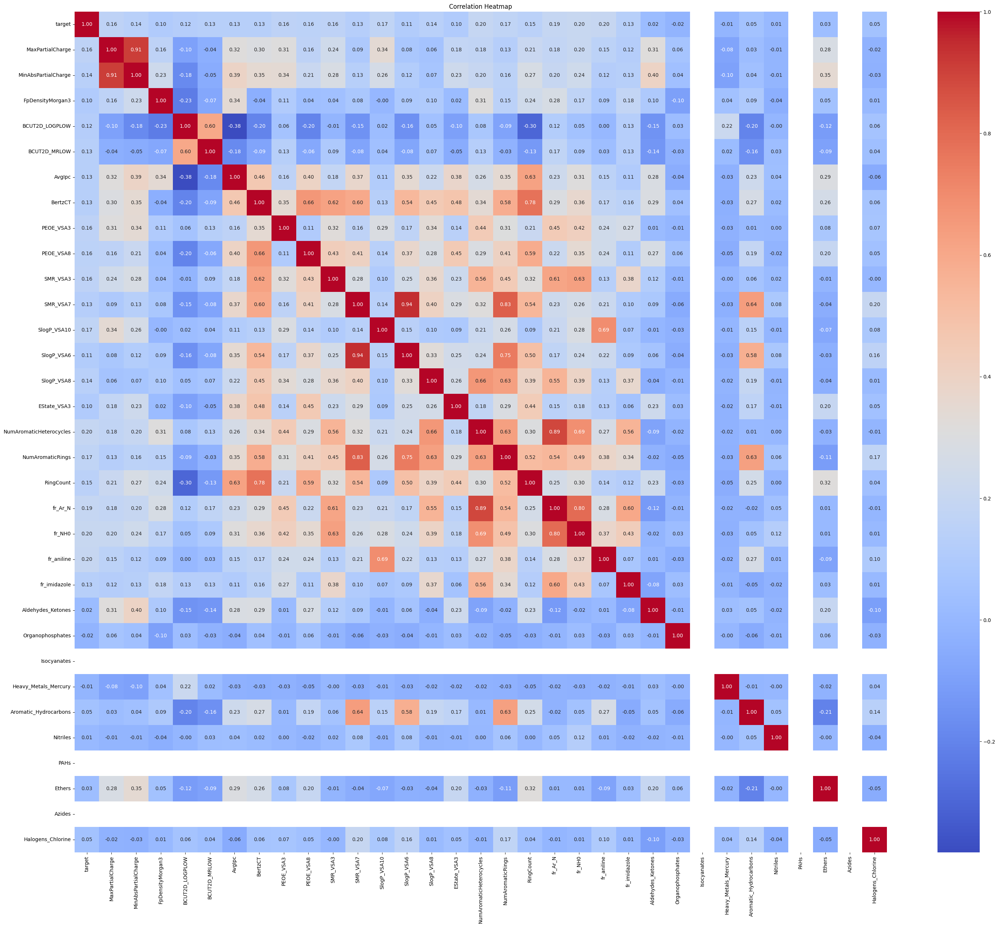

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame with the specified columns
corr_matrix = train[train.columns].corr()
plt.figure(figsize=(36, 30))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

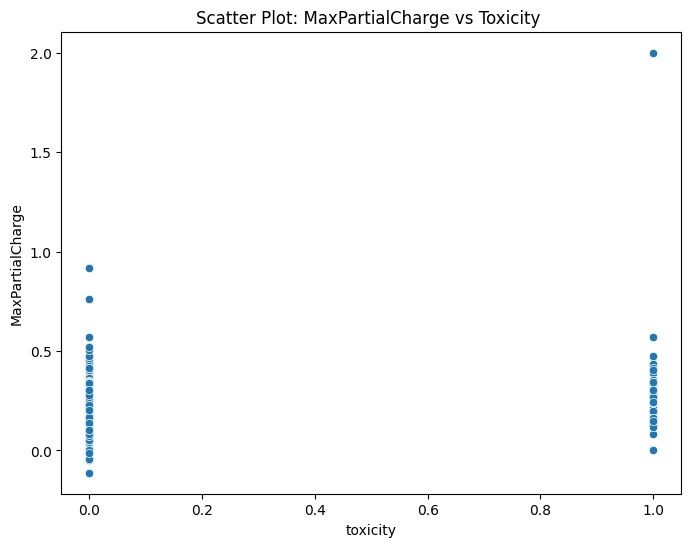

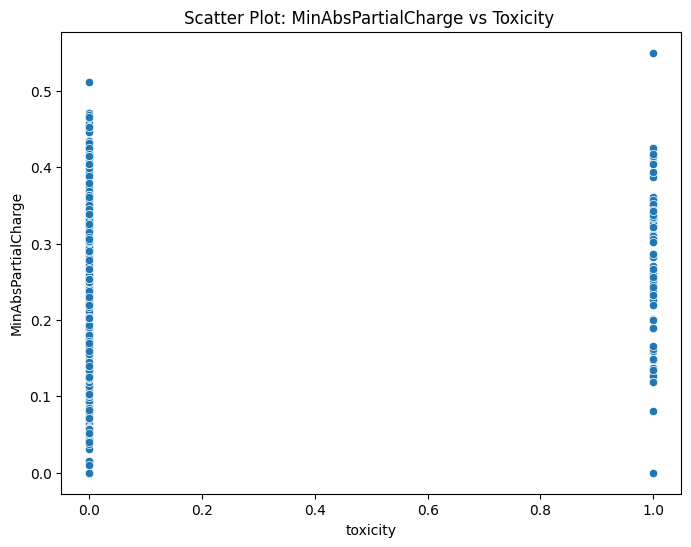

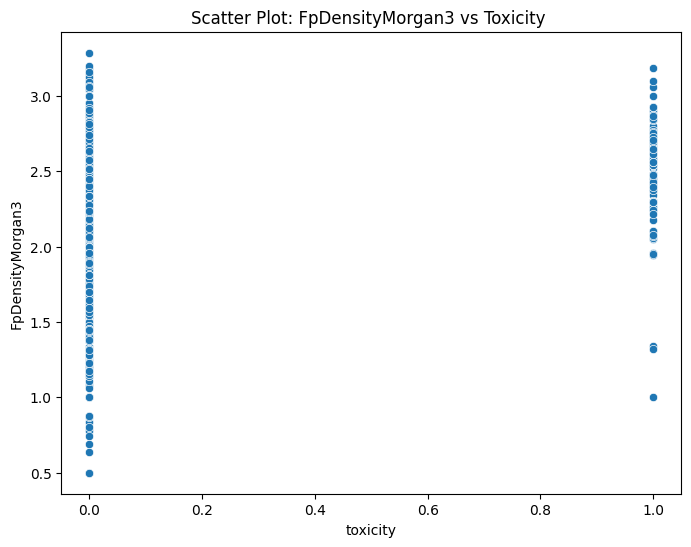

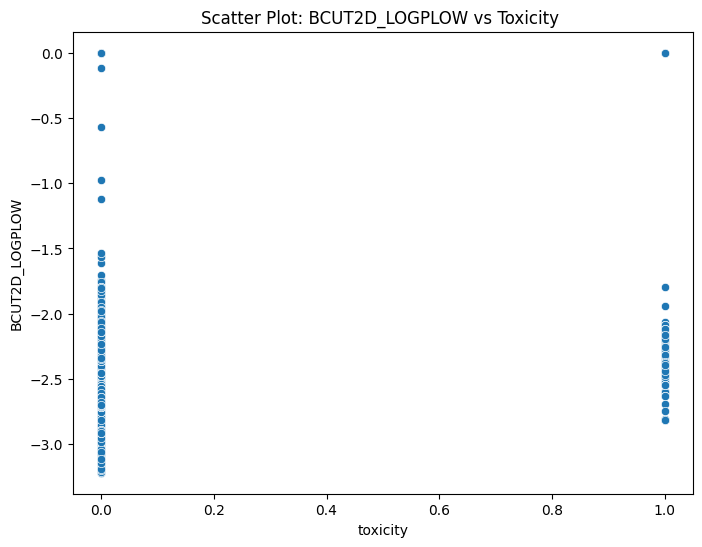

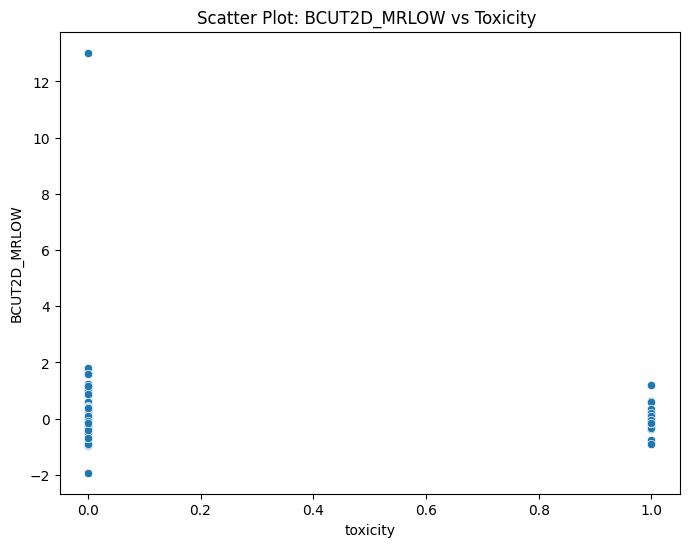

...

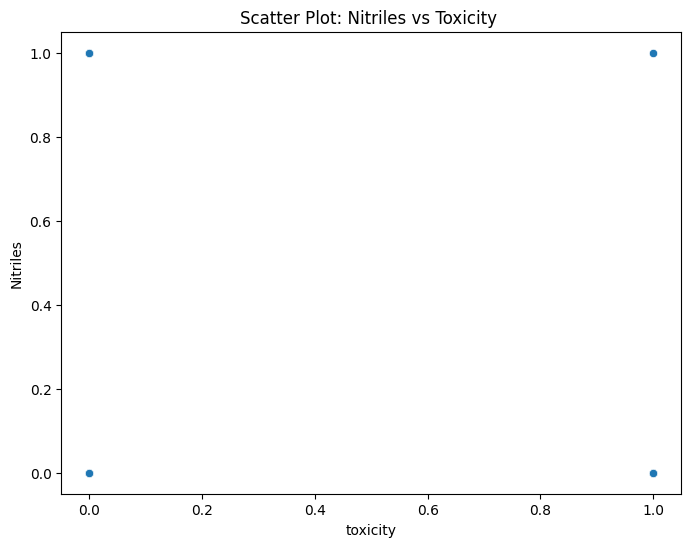

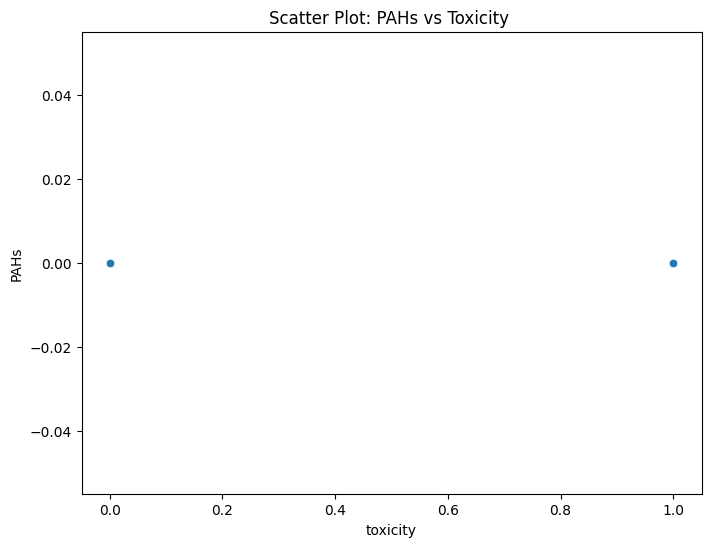

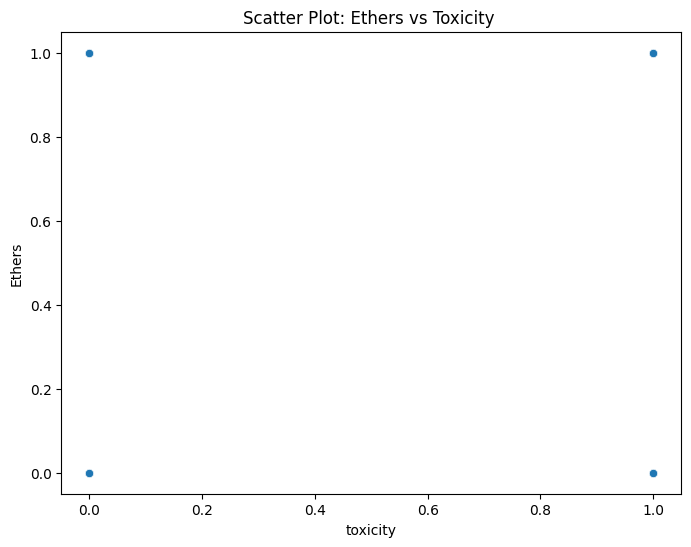

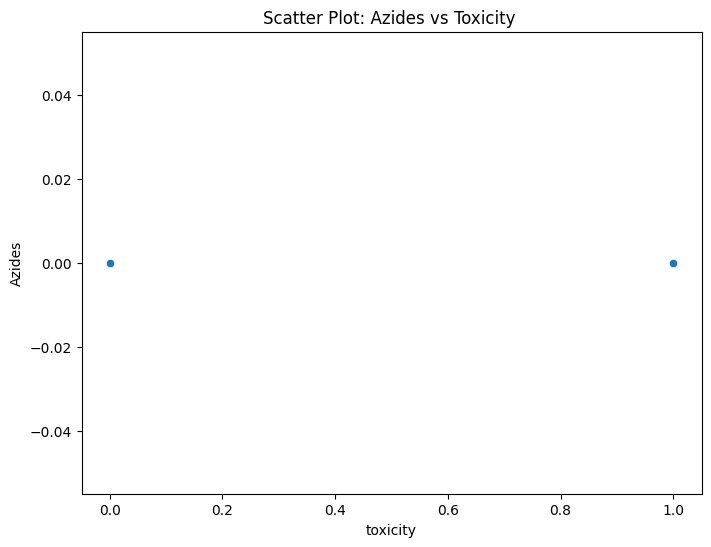

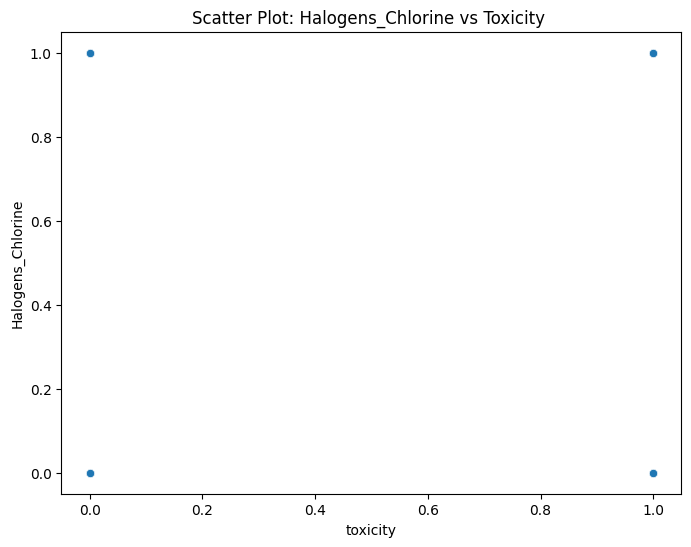

In [ ]:
for feature in xaxis:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='target', y=feature, data=train)
    plt.xlabel('toxicity')
    plt.ylabel(feature)
    plt.title(f'Scatter Plot: {feature} vs Toxicity ')
    plt.show()

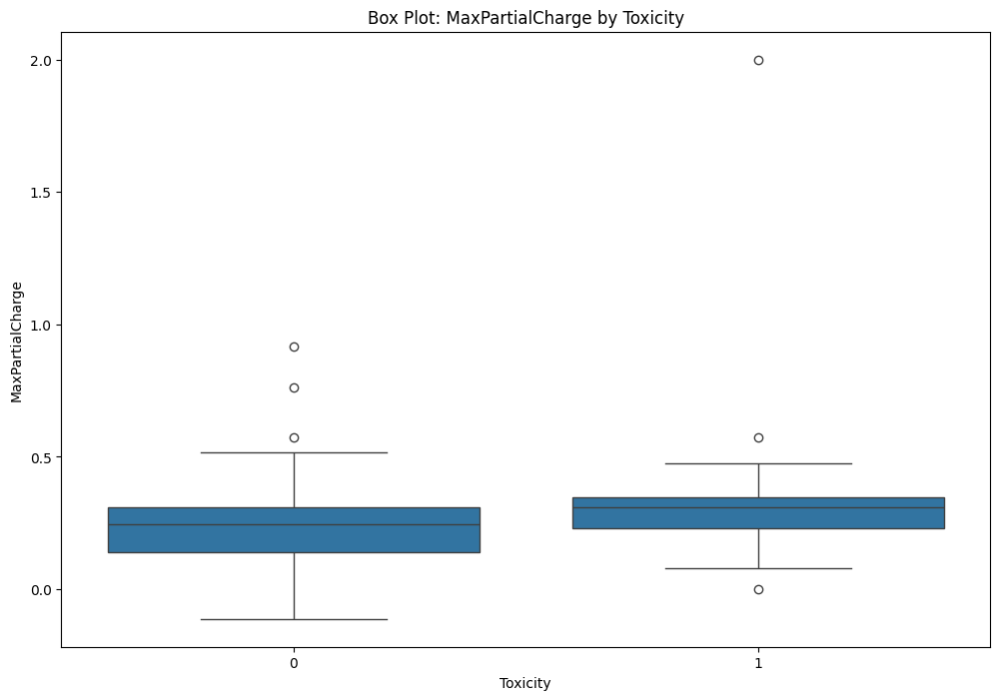

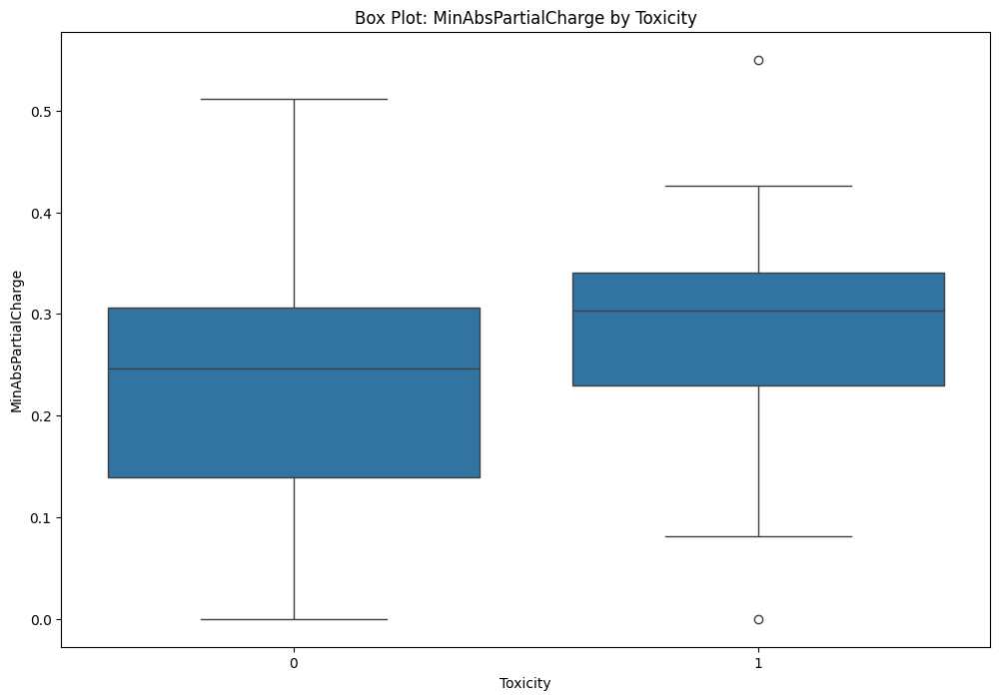

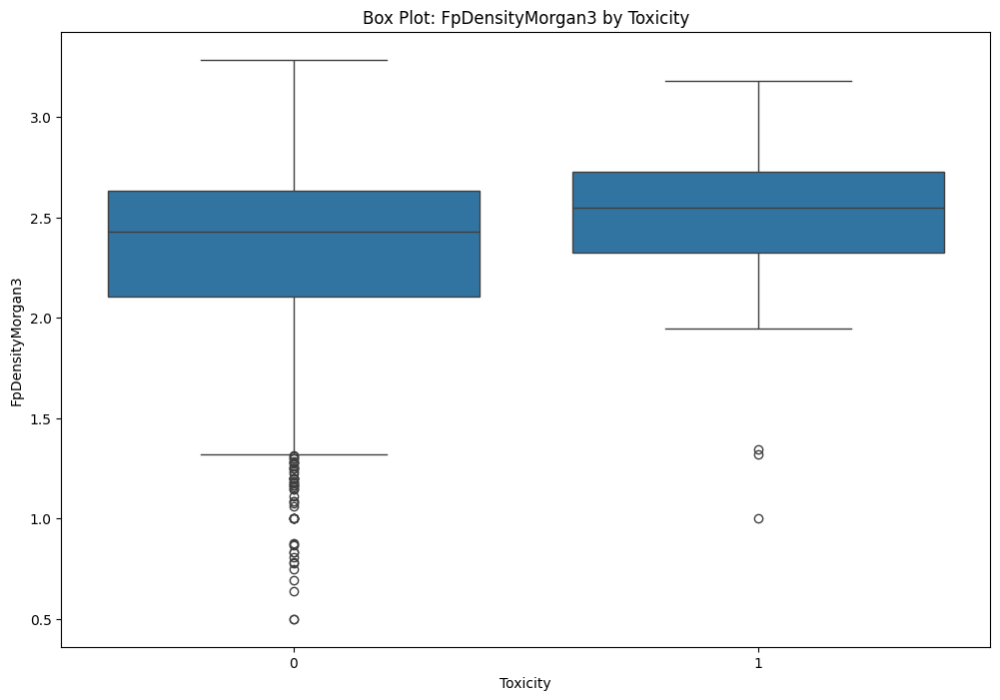

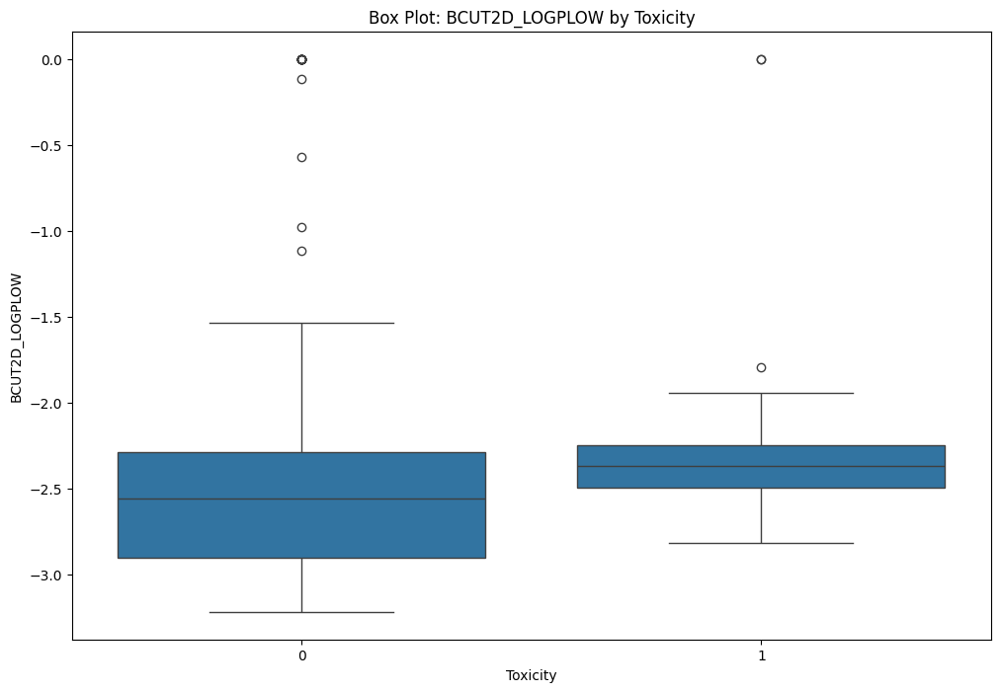

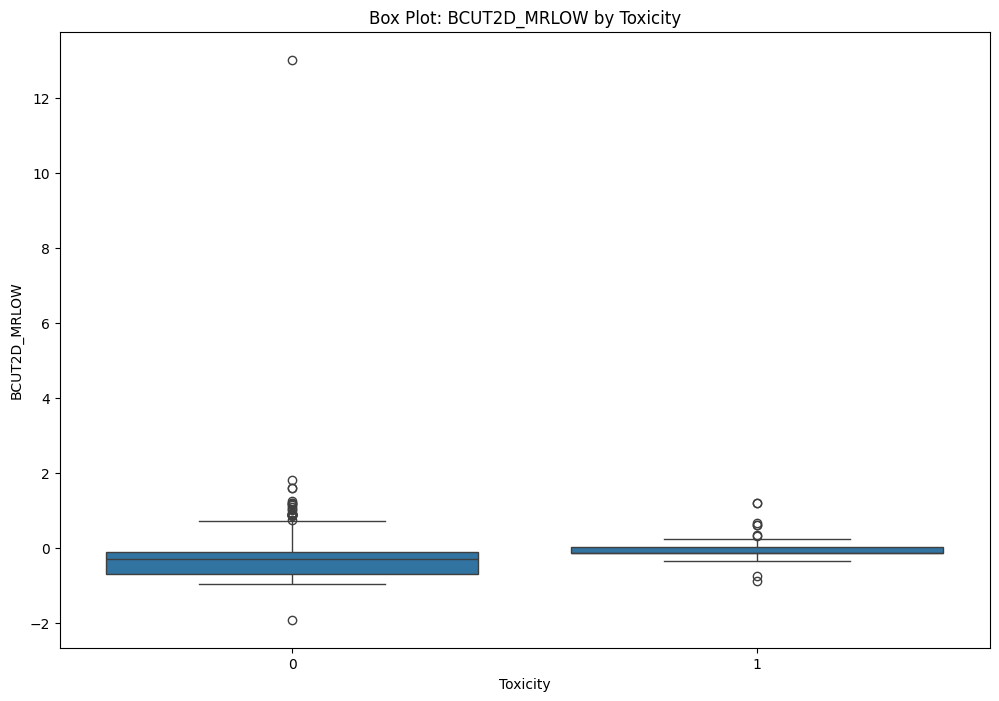

...

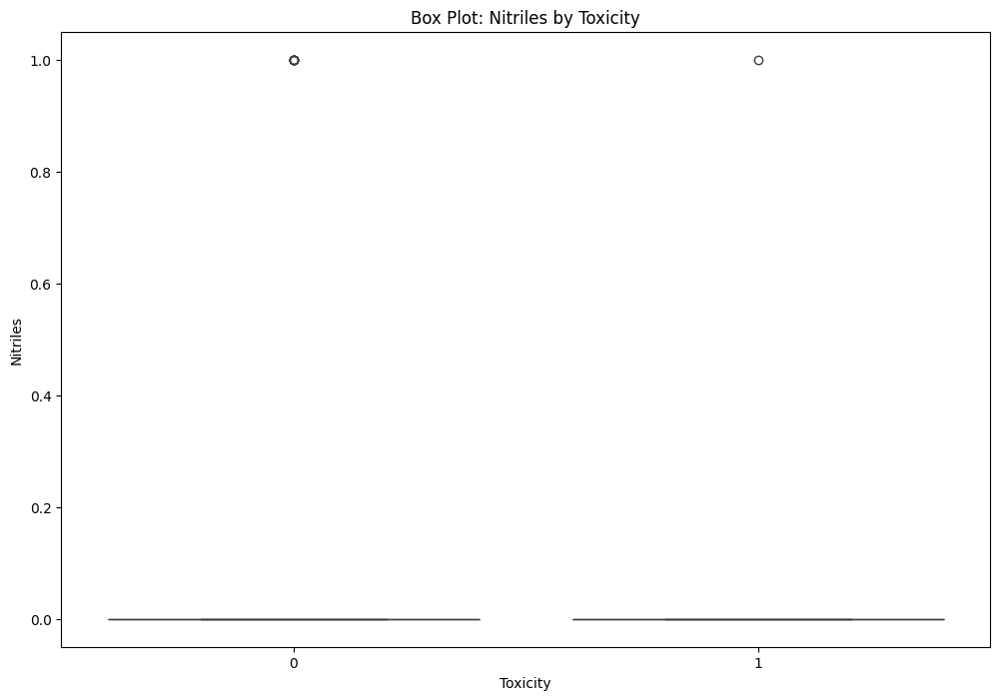

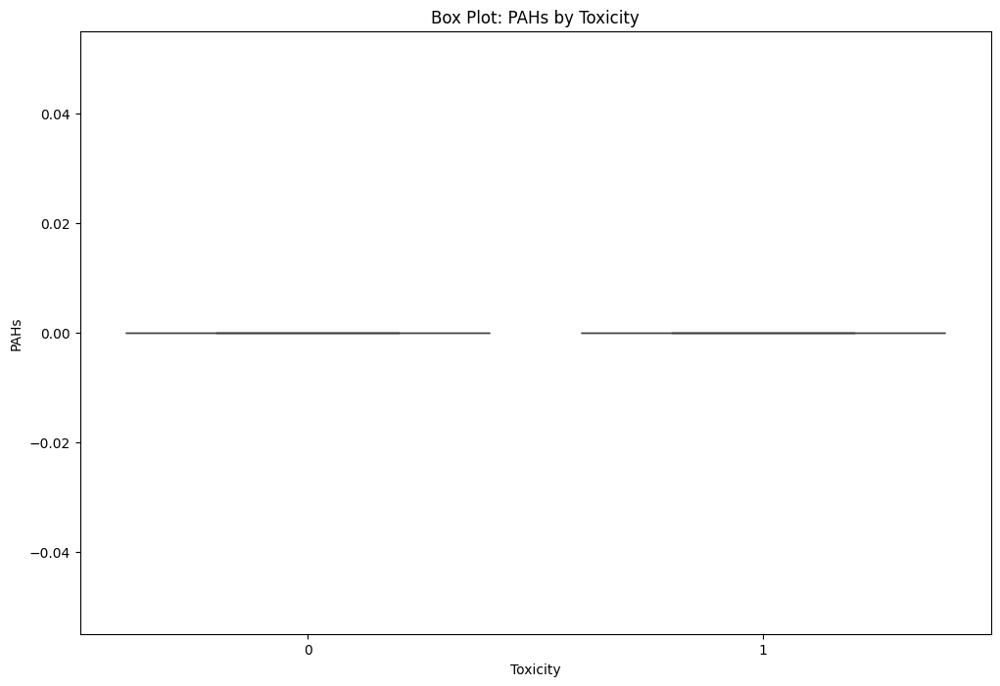

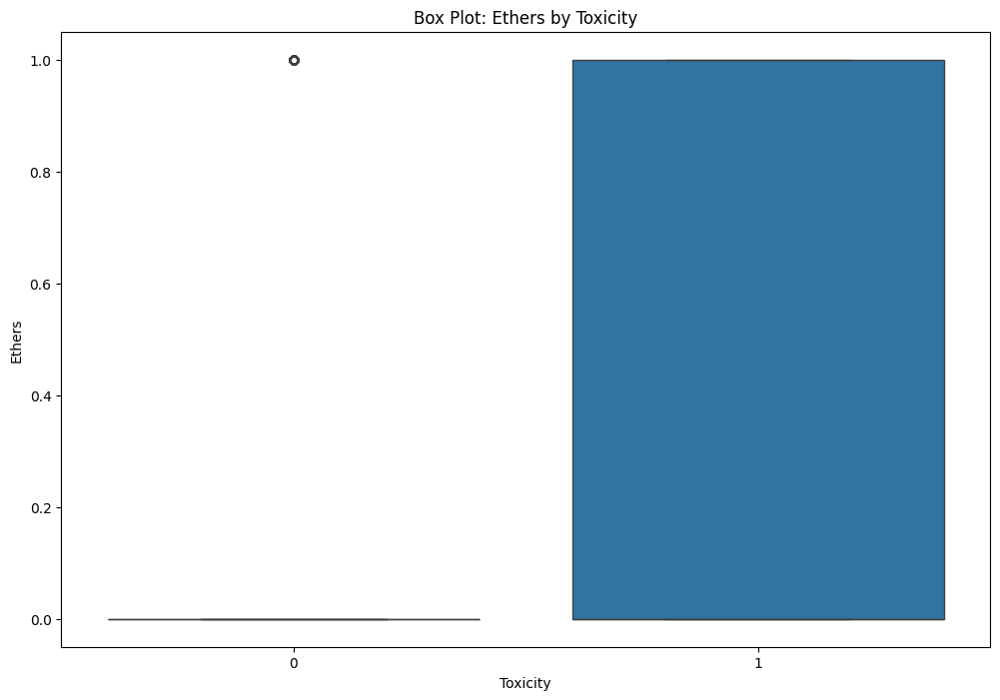

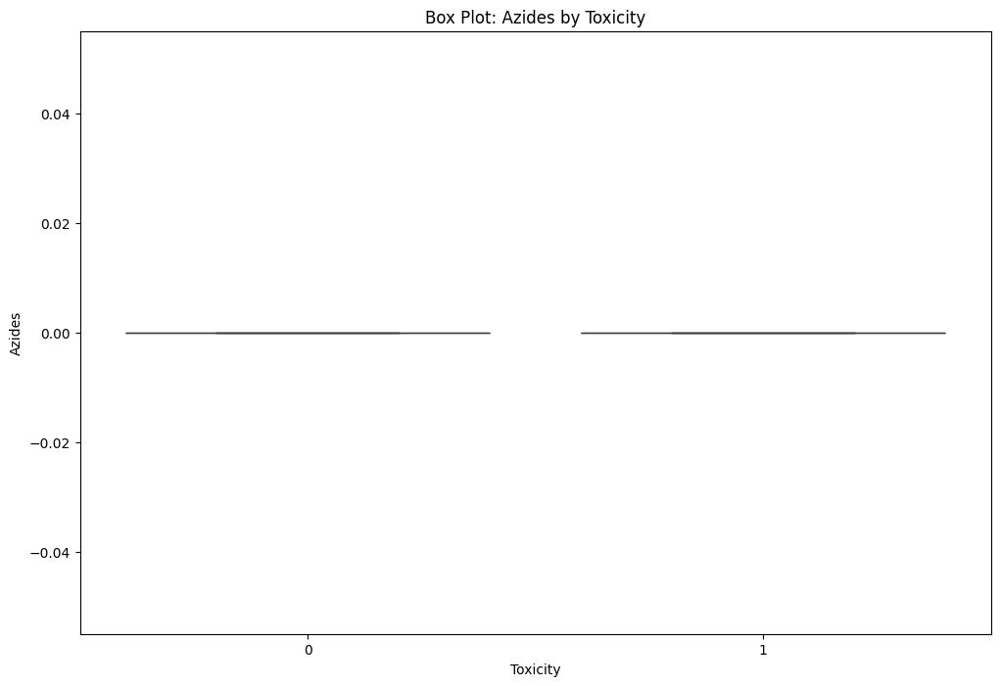

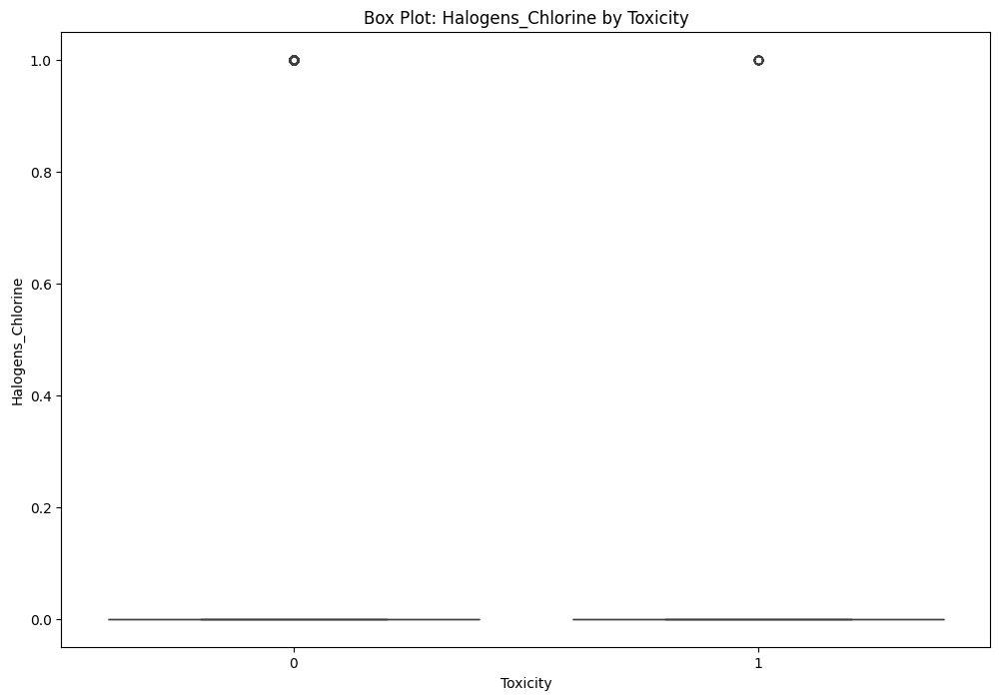

In [ ]:
for feature in xaxis:
    plt.figure(figsize=(12, 8))
    sns.boxplot(x='target', y=feature, data=train)
    plt.xlabel('Toxicity')
    plt.ylabel(feature)
    plt.title(f'Box Plot: {feature} by Toxicity')
    plt.show()

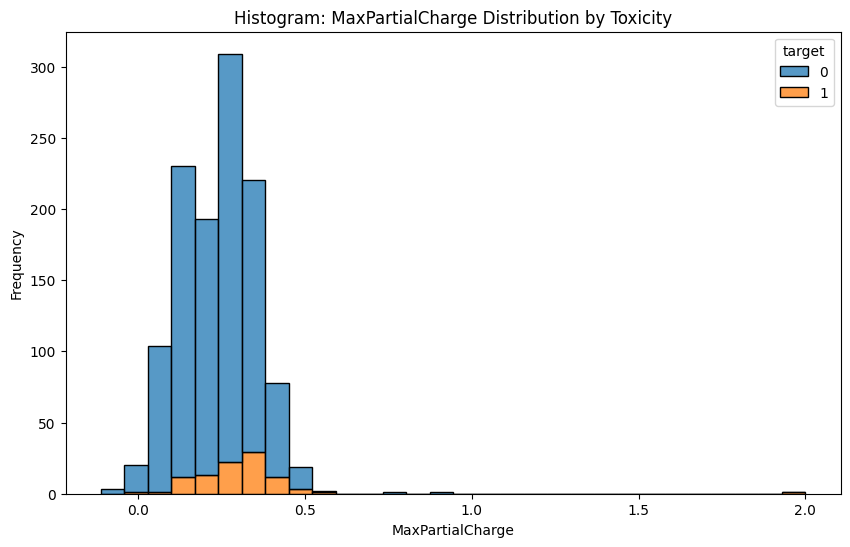

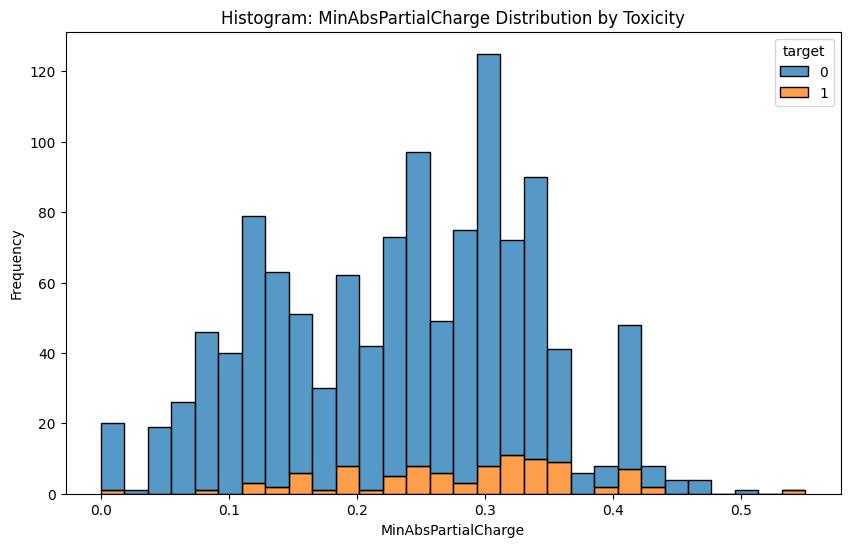

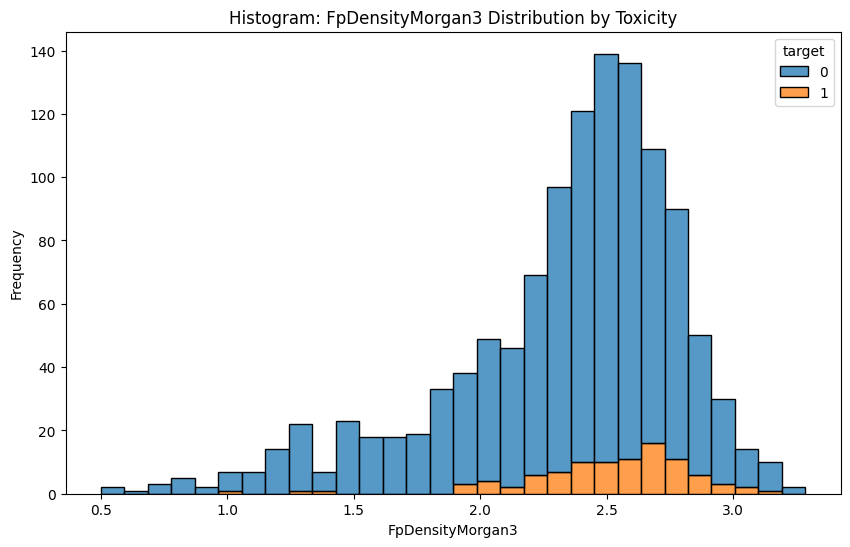

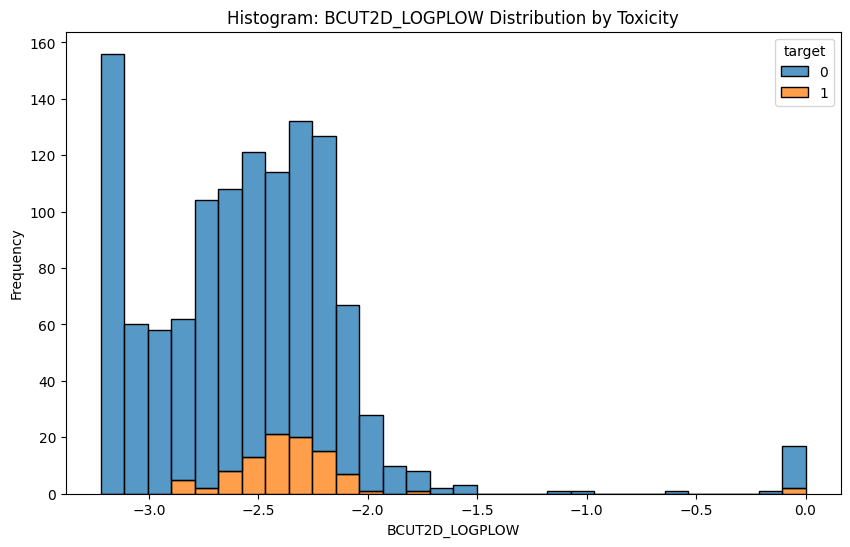

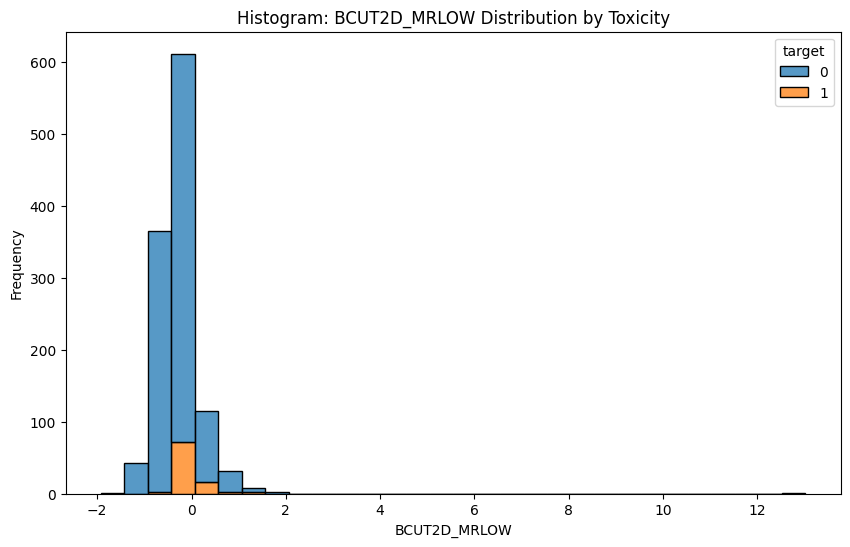

...

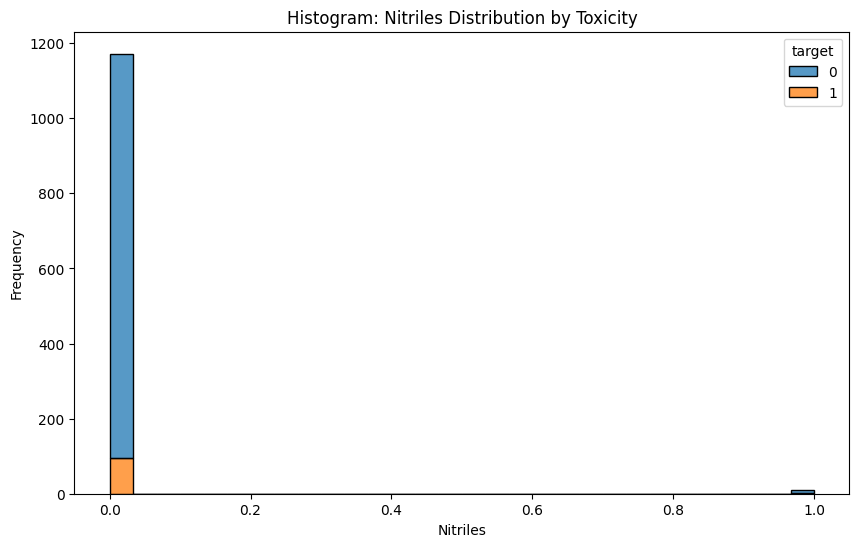

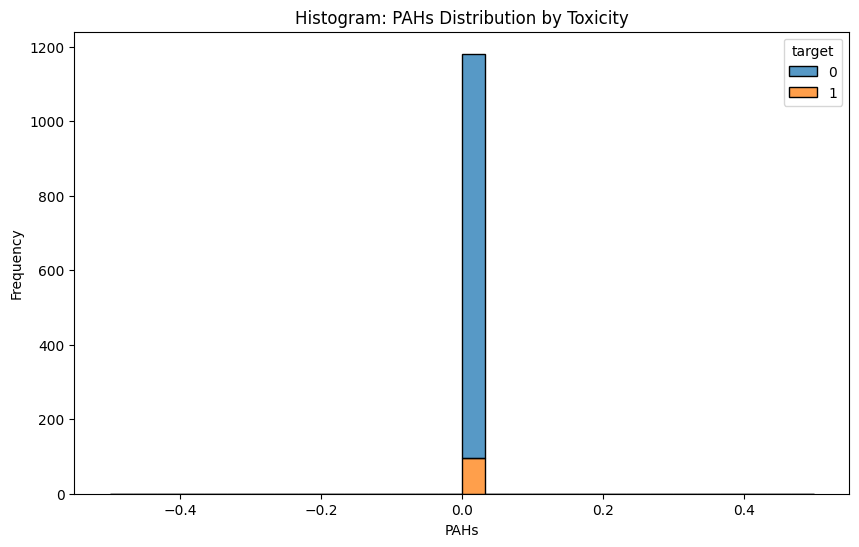

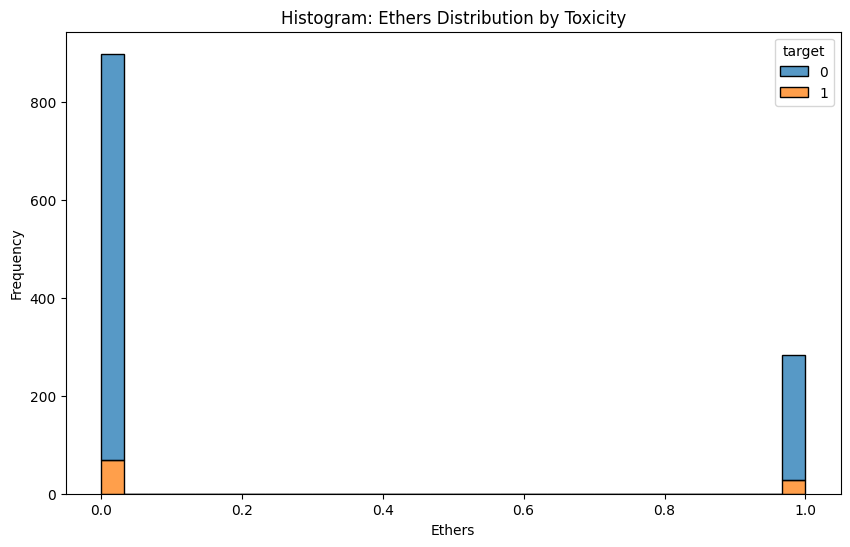

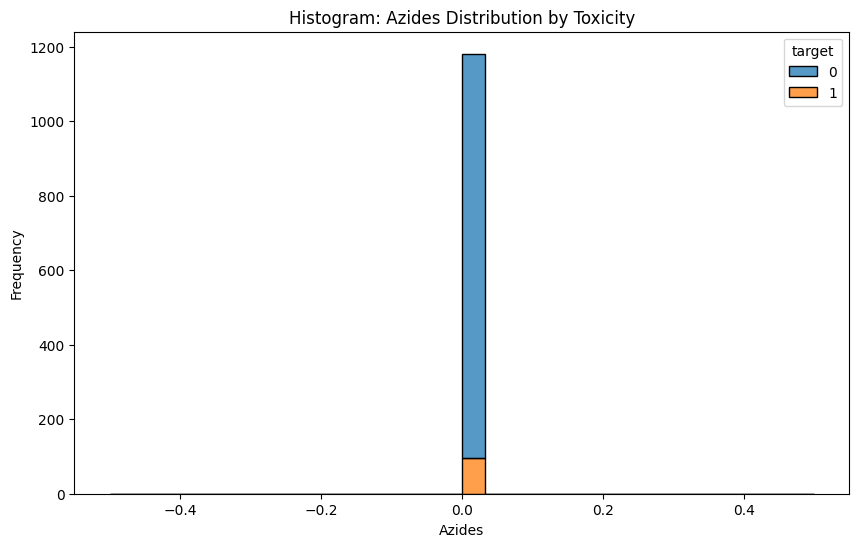

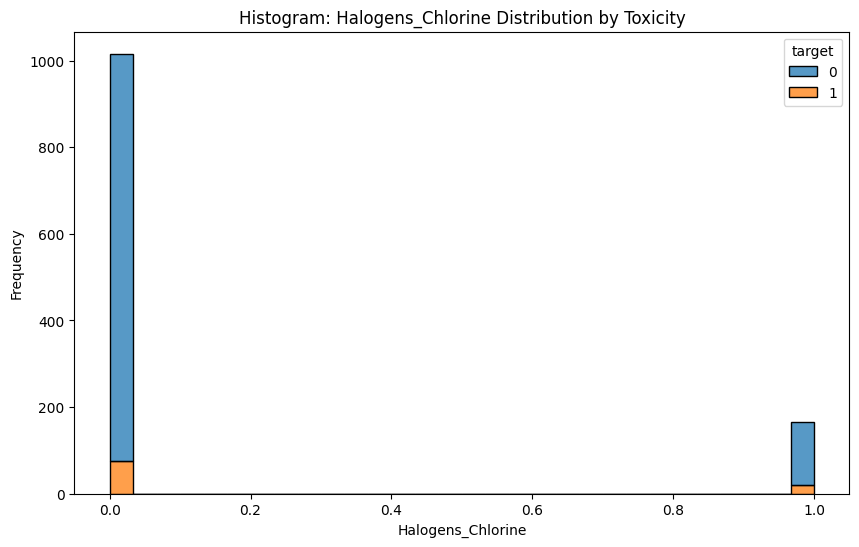

In [ ]:
for feature in xaxis:
    plt.figure(figsize=(10, 6))
    sns.histplot(train, x=feature, bins=30, hue='target', multiple='stack')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.title(f'Histogram: {feature} Distribution by Toxicity')
    plt.show()

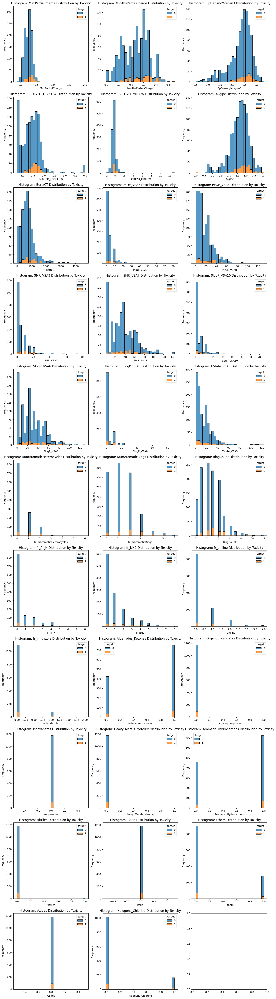

In [ ]:
num_features = len(xaxis)
num_cols = 3

num_rows = (num_features + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

for i, feature in enumerate(xaxis):
    row = i // num_cols
    col = i % num_cols

    sns.histplot(train, x=feature, bins=30, hue='target', multiple='stack', ax=axes[row, col])
    axes[row, col].set_xlabel(feature)
    axes[row, col].set_ylabel('Frequency')
    axes[row, col].set_title(f'Histogram: {feature} Distribution by Toxicity')

plt.tight_layout()
plt.show()

## **end of GRAPHS**

# **Model Developement**


In [57]:
#training the model by undersampling to reduce the class imbalance

sampl = RandomUnderSampler(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = sampl.fit_resample(x_train, y_train)

clf1 = LogisticRegression()
clf2 = SVC()
clf3 = KNeighborsClassifier()
clf4 = DecisionTreeClassifier()
clf5 = RandomForestClassifier()
clf6 = AdaBoostClassifier()
clf7 = GradientBoostingClassifier()
clf8 = XGBClassifier()

classifiers = [clf1, clf2, clf3, clf4, clf5, clf6, clf7, clf8]

for var in classifiers:
  var.fit(x_resampled, y_resampled)
  y_pred = var.predict(x_valid)

  print("\n")
  print(f"The Classification report of {var} is: \n {classification_report(y_valid, y_pred)} ")
  print(f"The AUC-ROC score: {roc_auc_score(y_valid, y_pred)}")
  print(f"The AUC-PRC Score: {average_precision_score(y_valid, y_pred)}")
  print("\n")



The Classification report of LogisticRegression() is: 
               precision    recall  f1-score   support

           0       0.97      0.74      0.84       141
           1       0.10      0.57      0.17         7

    accuracy                           0.73       148
   macro avg       0.53      0.65      0.50       148
weighted avg       0.93      0.73      0.81       148
 
The AUC-ROC score: 0.6545086119554204
The AUC-PRC Score: 0.0760193991901309




The Classification report of SVC() is: 
               precision    recall  f1-score   support

           0       0.99      0.57      0.72       141
           1       0.09      0.86      0.16         7

    accuracy                           0.58       148
   macro avg       0.54      0.71      0.44       148
weighted avg       0.95      0.58      0.69       148
 
The AUC-ROC score: 0.7122593718338399
The AUC-PRC Score: 0.08351581859044545




The Classification report of KNeighborsClassifier() is: 
               precision   

In [58]:
#training the model by oversampling to reduce the class imbalance
from imblearn.over_sampling import ADASYN
from sklearn.datasets import make_classification
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import average_precision_score


sampl = ADASYN(sampling_strategy='auto', random_state=42)
x_resampled1, y_resampled1 = sampl.fit_resample(x_train, y_train)

clf1 = LogisticRegression()
clf2 = SVC()
clf3 = KNeighborsClassifier()
clf4 = DecisionTreeClassifier()
clf5 = RandomForestClassifier()
clf6 = AdaBoostClassifier()
clf7 = GradientBoostingClassifier()
clf8 = XGBClassifier()

classifiers = [clf1, clf2, clf3, clf4, clf5, clf6, clf7, clf8]

for var in classifiers:
  var.fit(x_resampled1, y_resampled1)
  y_pred = var.predict(x_valid)

  print("\n")
  print(f"The Classification report of {var} is: \n {classification_report(y_valid, y_pred)} ")
  print(f"The AUC-ROC score: {roc_auc_score(y_valid, y_pred)}")
  print(f"The AUC-PRC Score: {average_precision_score(y_valid, y_pred)}")
  print("\n")



The Classification report of LogisticRegression() is: 
               precision    recall  f1-score   support

           0       0.98      0.64      0.77       141
           1       0.09      0.71      0.16         7

    accuracy                           0.64       148
   macro avg       0.53      0.68      0.47       148
weighted avg       0.94      0.64      0.74       148
 
The AUC-ROC score: 0.67629179331307
The AUC-PRC Score: 0.07728902371759515




The Classification report of SVC() is: 
               precision    recall  f1-score   support

           0       1.00      0.57      0.72       141
           1       0.10      1.00      0.19         7

    accuracy                           0.59       148
   macro avg       0.55      0.78      0.46       148
weighted avg       0.96      0.59      0.70       148
 
The AUC-ROC score: 0.7836879432624113
The AUC-PRC Score: 0.10294117647058823




The Classification report of KNeighborsClassifier() is: 
               precision    

In [59]:
x_train.shape

(1181, 32)

## **Neural Networks**

After applying every single supervised model, we decided to apply neural networks on it.


In [60]:
ann = Sequential()
ann.add(Dense(32, kernel_initializer = 'he_normal', input_dim = 32, activation = 'relu'))
ann.add(Dropout(0.2))
ann.add(Dense(16, kernel_initializer = 'he_normal',  activation = 'relu'))
ann.add(Dropout(0.2))
ann.add(Dense(1, kernel_initializer = 'he_normal', activation = 'sigmoid'))

In [61]:
ann.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                1056      
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 1601 (6.25 KB)
Trainable params: 1601 (6.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [62]:
ann.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [63]:
ann.fit(x_train, y_train, epochs = 20, batch_size = 8, validation_data = (x_valid, y_valid))

Epoch 1/20
148/148 [==============================] - 2s 4ms/step - loss: 47.2057 - accuracy: 0.6884 - val_loss: 14.1615 - val_accuracy: 0.9527
Epoch 2/20
148/148 [==============================] - 0s 3ms/step - loss: 19.9932 - accuracy: 0.8171 - val_loss: 5.5268 - val_accuracy: 0.9527
Epoch 3/20
148/148 [==============================] - 0s 2ms/step - loss: 11.7740 - accuracy: 0.8027 - val_loss: 2.4697 - val_accuracy: 0.9527
Epoch 4/20
148/148 [==============================] - 0s 2ms/step - loss: 6.3180 - accuracy: 0.8095 - val_loss: 1.7623 - val_accuracy: 0.9527
Epoch 5/20
148/148 [==============================] - 0s 2ms/step - loss: 3.3218 - accuracy: 0.8281 - val_loss: 0.2860 - val_accuracy: 0.9527
Epoch 6/20
148/148 [==============================] - 0s 2ms/step - loss: 2.3035 - accuracy: 0.8298 - val_loss: 0.3767 - val_accuracy: 0.9527
Epoch 7/20
148/148 [==============================] - 0s 2ms/step - loss: 1.8360 - accuracy: 0.8764 - val_loss: 0.3888 - val_accuracy: 0.9527
Ep

As we can cleary see, the data available for training is very less to be fed into a neural network, thus, we shall only stick to ML models.

## **Fine tuning the model**

In [72]:
#We are choosing XGboost on undersampled data as it is performing the best

param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5],
    'colsample_bytree': [0.8, 0.9, 1.0],
}

grid_search = GridSearchCV(
    clf8,
    param_grid=param_grid,
    scoring='roc_auc',
    cv=3,
    n_jobs=-1,
)

grid_search.fit(x_resampled , y_resampled)

# Get the best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [73]:
best_params

{'colsample_bytree': 0.9,
 'learning_rate': 0.01,
 'max_depth': 3,
 'n_estimators': 200}

In [75]:
#Our final model
best_model.fit(x_resampled, y_resampled)
y_pred = best_model.predict(x_valid)

print("\n")
print(f"The Classification report of fine tuned model is :\n {classification_report(y_valid, y_pred)}")
print("\n")
print(f"The AUC-ROC score of the fine tuned model is: {roc_auc_score(y_valid, y_pred)}")



The Classification report of fine tuned model is :
               precision    recall  f1-score   support

           0       0.99      0.82      0.89       141
           1       0.19      0.86      0.31         7

    accuracy                           0.82       148
   macro avg       0.59      0.84      0.60       148
weighted avg       0.95      0.82      0.87       148



The AUC-ROC score of the fine tuned model is: 0.8363728470111448
